## Vietnam Stock Price Prediction & Portfolio Optimization
### HOSE Market selected tickers: MSN, HPG, MBB, BID, VIC, VCB, PLX, GAS, FPT, VNM

---
**Why these 10 tickers?**
- **MSN** (Masan Group): FMCG + Resources — stable revenue
- **HPG** (Hoa Phat Group): Steel — largest steel maker in Vietnam
- **MBB** (Military Bank): Banking — high growth, solid fundamentals
- **BID** (BIDV): State banking — largest state bank by assets
- **VIC** (Vingroup): Conglomerate / Real estate — most diversified
- **VCB** (Vietcombank): Banking — most liquid state bank on HOSE
- **PLX** (Petrolimex): Energy / Petroleum — monopoly on fuel distribution
- **GAS** (PetroVietnam Gas): Energy — gas distribution monopoly
- **FPT** (FPT Corp): Technology — Vietnam's leading IT company
- **VNM** (Vinamilk): FMCG / Dairy — defensive stock with consistent dividends

These 10 cover 5 industries (banking, tech, energy, FMCG, real estate/conglomerate), have 120+ data points, all on HOSE, ensuring sufficient data for time-series modeling and a well-diversified portfolio.

## 1. Data Loading

In [2]:
# Install dependencies
!pip install vnstock3 --upgrade -q
!pip install scipy -q

In [3]:
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
from scipy.optimize import minimize

from sklearn.preprocessing import MinMaxScaler, StandardScaler # Added StandardScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report

import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2


warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
tf.random.set_seed(42)
np.random.seed(42)

print(f"TensorFlow version: {tf.__version__}")
print(f"NumPy version: {np.__version__}")

TensorFlow version: 2.20.0
NumPy version: 2.0.2


In [4]:
!pip install --upgrade vnstock

In [5]:
!git clone https://github.com/thinh-vu/vnstock

fatal: destination path 'vnstock' already exists and is not an empty directory.


In [6]:
!pip install --upgrade vnstock

In [7]:
import time
import pandas as pd
import numpy as np
from vnstock import register_user, Quote

# 1. Authentication
register_user(api_key='vnstock_4bc855a792fb8d4dd2b46004640bda25')

# 2. Configuration
STOCK_LIST = ['MSN', 'HPG', 'MBB', 'BID', 'VIC', 'VCB', 'PLX', 'GAS', 'FPT', 'VNM']
STOCK_LIST   = ['MSN', 'HPG', 'MBB', 'BID', 'VIC', 'VCB', 'PLX', 'GAS', 'FPT', 'VNM']
INDUSTRY_MAP = {
    'MSN': 'FMCG',    'HPG': 'Materials', 'MBB': 'Banking',
    'BID': 'Banking', 'VIC': 'Real Estate','VCB': 'Banking',
    'PLX': 'Energy',  'GAS': 'Energy',    'FPT': 'Technology',
    'VNM': 'FMCG'}
START_DATE = '2015-01-01'
END_DATE = '2024-01-01'

def add_technical_indicators(df: pd.DataFrame) -> pd.DataFrame:
    """Add SMA, MACD, RSI, and Bollinger Bands to the dataframe."""
    df = df.copy()
    close = df['close']
    df['SMA_20'] = close.rolling(20).mean()
    df['SMA_50'] = close.rolling(50).mean()
    ema12 = close.ewm(span=12, adjust=False).mean()
    ema26 = close.ewm(span=26, adjust=False).mean()
    df['MACD'] = ema12 - ema26
    df['MACD_sig'] = df['MACD'].ewm(span=9, adjust=False).mean()
    delta = close.diff(1)
    gain = delta.clip(lower=0)
    loss = (-delta).clip(lower=0)
    avg_gain = gain.ewm(com=13, adjust=False).mean()
    avg_loss = loss.ewm(com=13, adjust=False).mean()
    rs = avg_gain / avg_loss.replace(0, np.nan)
    df['RSI'] = 100 - 100 / (1 + rs)
    df['BB_mid'] = close.rolling(20).mean()
    bb_std = close.rolling(20).std()
    df['BB_upper'] = df['BB_mid'] + 2 * bb_std
    df['BB_lower'] = df['BB_mid'] - 2 * bb_std
    df['pct_change'] = close.pct_change() * 100
    df.fillna(method='bfill', inplace=True)
    df.fillna(0, inplace=True)
    return df

# 3. Data Fetching and Enrichment
raw_data = {}
enriched_data = {}

print("Starting data recovery...")
for ticker in STOCK_LIST:
    try:
        q = Quote(symbol=ticker, source='KBS')
        df = q.history(start=START_DATE, end=END_DATE, interval='1D')

        # Standardize columns
        df.columns = [c.lower() for c in df.columns]
        df.rename(columns={'time': 'date', 'tradingdate': 'date'}, inplace=True)
        if 'date' not in df.columns and isinstance(df.index, pd.DatetimeIndex):
            df = df.reset_index().rename(columns={'index': 'date'})

        df['ticker'] = ticker
        df['date'] = pd.to_datetime(df['date'])
        df.sort_values('date', inplace=True)

        if len(df) >= 120:
            raw_data[ticker] = df
            enriched_data[ticker] = add_technical_indicators(df)
            print(f"✓ {ticker}: {len(df)} rows loaded and enriched.")
        else:
            print(f"✗ {ticker}: insufficient data ({len(df)} rows)")

    except Exception as e:
        print(f"✗ {ticker}: Error — {e}")

    time.sleep(1) # Stay within rate limits

print(f"\nInitialization complete. {len(enriched_data)} tickers ready for modeling.")

✓ API key đã được lưu thành công! (API key saved successfully!)
Bạn đang sử dụng Phiên bản cộng đồng (60 requests/phút)
(You are using Community version - 60 requests/minute)

Để tham gia gói thành viên tài trợ (To join sponsor membership):
  Truy cập: https://vnstocks.com/insiders-program
✓ API key đã được lưu thành công! (✓ API key saved successfully! vnst***da25
✓ Bạn đang sử dụng gói Cộng đồng (✓ You are using Community Edition - 60 requests/min)
Starting data recovery...


✓ MSN: 2068 rows loaded and enriched.
✓ HPG: 1915 rows loaded and enriched.
✓ MBB: 2068 rows loaded and enriched.
✓ BID: 2025 rows loaded and enriched.
✓ VIC: 2018 rows loaded and enriched.
✓ VCB: 2025 rows loaded and enriched.
✓ PLX: 1676 rows loaded and enriched.
✓ GAS: 2025 rows loaded and enriched.
✓ FPT: 2019 rows loaded and enriched.
✓ VNM: 2025 rows loaded and enriched.

Initialization complete. 10 tickers ready for modeling.


In [9]:
import time
import pandas as pd

#  vnstock – use the new unified API
from vnstock import Quote          # <-- correct, stable import

STOCK_LIST   = ['MSN', 'HPG', 'MBB', 'BID', 'VIC', 'VCB', 'PLX', 'GAS', 'FPT', 'VNM']
INDUSTRY_MAP = {
    'MSN': 'FMCG',    'HPG': 'Materials', 'MBB': 'Banking',
    'BID': 'Banking', 'VIC': 'Real Estate','VCB': 'Banking',
    'PLX': 'Energy',  'GAS': 'Energy',    'FPT': 'Technology',
    'VNM': 'FMCG'
}

START_DATE   = '2015-01-01'
END_DATE     = '2024-01-01'
WINDOW_SIZE  = 30
FEATURE_COLS = ['open', 'high', 'low', 'close', 'volume']
TARGET_COL   = 'close'

raw_data = {}

for ticker in STOCK_LIST:
    try:
        # Use the recommended Quote class with source='KBS' (more reliable)
        q = Quote(symbol=ticker, source='KBS')
        df = q.history(start=START_DATE, end=END_DATE, interval='1D')

        # Standardise column names to lowercase
        df.columns = [c.lower() for c in df.columns]

        # Rename date column (KBS returns 'time', VCI returns 'tradingdate')
        df.rename(columns={'time': 'date', 'tradingdate': 'date'}, inplace=True)

        # If date is the index, move it to a column
        if 'date' not in df.columns and df.index.dtype == 'datetime64[ns]':
            df = df.reset_index().rename(columns={'index': 'date'})

        df['ticker'] = ticker
        df['date']   = pd.to_datetime(df['date'])
        df.sort_values('date', inplace=True)
        df.reset_index(drop=True, inplace=True)

        if len(df) >= 120:
            raw_data[ticker] = df
            print(f"✓ {ticker}: {len(df)} rows  ({df['date'].min().date()} – {df['date'].max().date()})")
        else:
            print(f"✗ {ticker}: insufficient data ({len(df)} rows)")

    except Exception as e:
        print(f"✗ {ticker}: Error — {e}")

    time.sleep(1.5)   # Stay safely under even the 60 req/min community limit

print(f"\nLoaded {len(raw_data)} tickers successfully.")


📋 Kết nối tài khoản Google Drive để lưu các thiết lập của dự án.
Dữ liệu phiên làm việc với Colab của bạn sẽ bị xóa nếu không lưu trữ vào Google Drive.

✓ MSN: 2068 rows  (2015-09-28 – 2023-12-29)
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✓ HPG: 1915 rows  (2016-05-11 – 2023-12-29)
✓ MBB: 2068 rows  (2015-09-28 – 2023-12-29)
✓ BID: 2025 rows  (2015-11-26 – 2023-12-29)
✓ VIC: 2018 rows  (2015-12-07 – 2023-12-29)
✓ VCB: 2025 rows  (2015-11-26 – 2023-12-29)
✓ PLX: 1676 rows  (2017-04-21 – 2023-12-29)
✓ GAS: 2025 rows  (2015-11-26 – 2023-12-29)
✓ FPT: 2019 rows  (2015-12-04 – 2023-12-29)
✓ VNM: 2025 rows  (2015-11-26 – 2023-12-29)

Loaded 10 tickers successfully.


In [ ]:
# 1. IMPORTS & CONFIGURATION
import time
import pandas as pd
import numpy as np

# ─── vnstock unified API ──────────────────────────────────────
from vnstock import Quote

# Stock universe & industry mapping
TICKERS = ['MSN', 'HPG', 'MBB', 'BID', 'VIC', 'VCB', 'PLX', 'GAS', 'FPT', 'VNM']
INDUSTRY_MAP = {
    'MSN': 'FMCG',    'HPG': 'Materials', 'MBB': 'Banking',
    'BID': 'Banking', 'VIC': 'Real Estate','VCB': 'Banking',
    'PLX': 'Energy',  'GAS': 'Energy',    'FPT': 'Technology',
    'VNM': 'FMCG'
}

# Data window & label parameters
WINDOW_SIZE = 60          # look‑back days for the LSTM
K_DAY       = 7           # forecast horizon for labels (days ahead)
K_CONSEC    = 7           # not used here but kept for compatibility
MIN_ROWS    = 120         # minimal data length per ticker

# Training hyper‑params
EPOCHS      = 50
BATCH_SIZE  = 64
LR          = 1e-3

# Date range
START_DATE  = '2013-01-01'
END_DATE    = '2024-12-31'

# Features to use in the model (all lowercase, as they come from the data)
FEAT_COLS = ['open','high','low','close','volume',
             'SMA_20','SMA_50','MACD','MACD_sig','RSI',
             'BB_upper','BB_lower','pct_change']
# 2. HELPER: Technical indicators
def add_technical_indicators(df: pd.DataFrame) -> pd.DataFrame:
    """Add SMA, MACD, RSI, and Bollinger Bands to the dataframe."""
    df = df.copy()
    close = df['close']

    # Simple moving averages
    df['SMA_20'] = close.rolling(20).mean()
    df['SMA_50'] = close.rolling(50).mean()

    # MACD (12, 26, 9)
    ema12 = close.ewm(span=12, adjust=False).mean()
    ema26 = close.ewm(span=26, adjust=False).mean()
    df['MACD'] = ema12 - ema26
    df['MACD_sig'] = df['MACD'].ewm(span=9, adjust=False).mean()

    # RSI (14 periods)
    delta = close.diff(1)
    gain = delta.clip(lower=0)
    loss = (-delta).clip(lower=0)
    avg_gain = gain.ewm(com=13, adjust=False).mean()
    avg_loss = loss.ewm(com=13, adjust=False).mean()
    rs = avg_gain / avg_loss.replace(0, np.nan)
    df['RSI'] = 100 - 100 / (1 + rs)

    # Bollinger Bands (20, 2)
    df['BB_mid'] = close.rolling(20).mean()
    bb_std = close.rolling(20).std()
    df['BB_upper'] = df['BB_mid'] + 2 * bb_std
    df['BB_lower'] = df['BB_mid'] - 2 * bb_std

    # Daily percentage change
    df['pct_change'] = close.pct_change() * 100

    # Fill missing values that result from rolling/ewm
    df.fillna(method='bfill', inplace=True)
    df.fillna(0, inplace=True)

    return df

# 3. FETCH RAW DATA & ENRICH
raw_data = {}
enriched_data = {}

print("Starting data recovery...")
for ticker in STOCK_LIST:
    try:
        # Use KBS source (reliable, free, no key required)
        q = Quote(symbol=ticker, source='KBS')
        df = q.history(start=START_DATE, end=END_DATE, interval='1D')

        # Standardise column names to lowercase
        df.columns = [c.lower() for c in df.columns]

        # Rename date column (KBS returns 'time', VCI returns 'tradingdate')
        df.rename(columns={'time': 'date', 'tradingdate': 'date'}, inplace=True)

        # If date is still the index, move it to a column
        if 'date' not in df.columns and isinstance(df.index, pd.DatetimeIndex):
            df = df.reset_index().rename(columns={'index': 'date'})

        df['ticker'] = ticker
        df['date'] = pd.to_datetime(df['date'])
        df.sort_values('date', inplace=True)
        df.reset_index(drop=True, inplace=True)

        # Keep only dataframes with enough history (≥120 trading days)
        if len(df) >= 120:
            raw_data[ticker] = df
            enriched_data[ticker] = add_technical_indicators(df)
            print(f"✓ {ticker}: {len(df)} rows loaded and enriched.")
        else:
            print(f"✗ {ticker}: insufficient data ({len(df)} rows)")

    except Exception as e:
        print(f"✗ {ticker}: Error — {e}")

    time.sleep(1.5)   # Respect rate limits

print(f"\nInitialisation complete. {len(enriched_data)} tickers ready for modelling.")

Starting data recovery...
✓ MSN: 2318 rows loaded and enriched.
✓ HPG: 2165 rows loaded and enriched.
✓ MBB: 2318 rows loaded and enriched.
✓ BID: 2275 rows loaded and enriched.
✓ VIC: 2268 rows loaded and enriched.
✓ VCB: 2275 rows loaded and enriched.
✓ PLX: 1926 rows loaded and enriched.
✓ GAS: 2275 rows loaded and enriched.
✓ FPT: 2269 rows loaded and enriched.
✓ VNM: 2275 rows loaded and enriched.

Initialisation complete. 10 tickers ready for modelling.


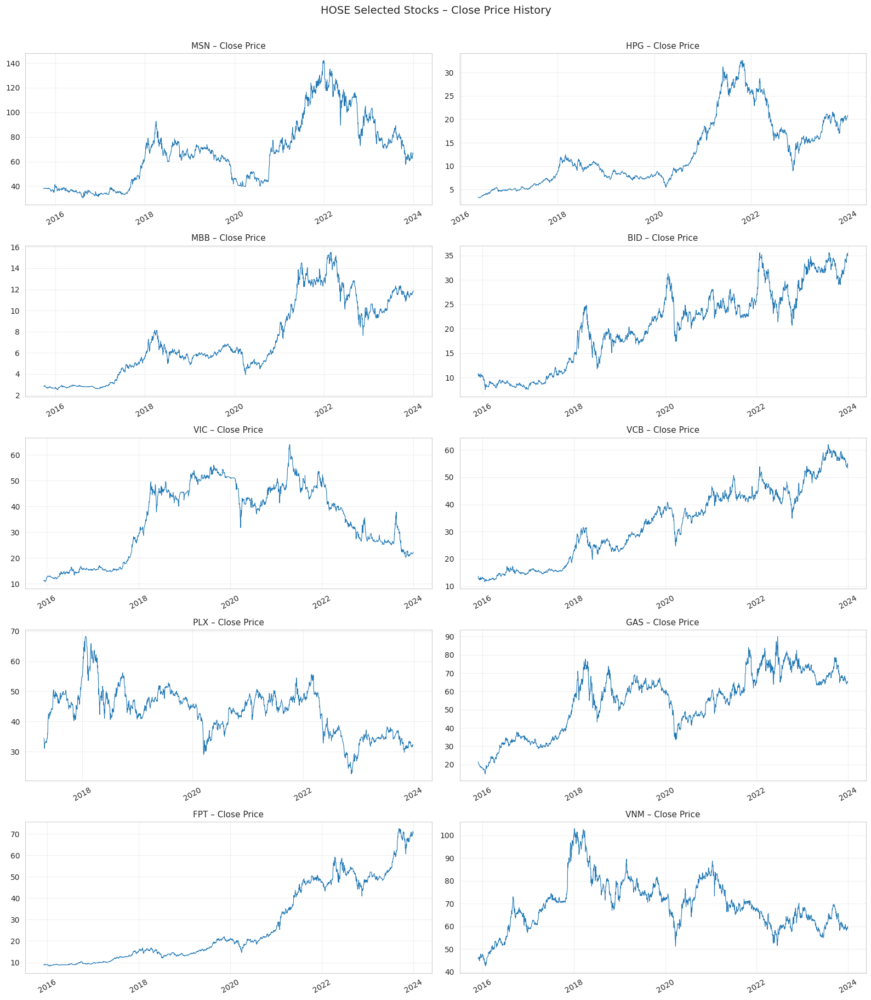

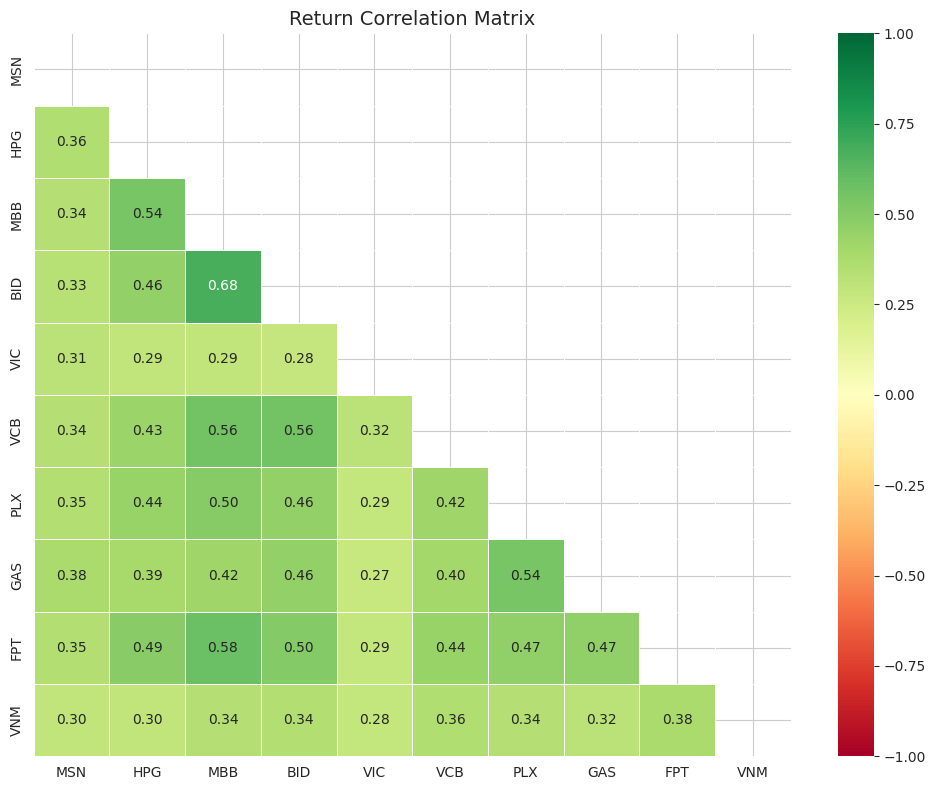

In [10]:
import matplotlib.dates as mdates # Import mdates

# EXPLORATORY DATA ANALYSIS
fig, axes = plt.subplots(5, 2, figsize=(16, 18))
for ax, (tk, df) in zip(axes.flat, raw_data.items()):
    ax.plot(df['date'], df['close'], linewidth=0.8)
    ax.set_title(f'{tk} – Close Price', fontsize=11)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.xaxis.set_major_locator(mdates.YearLocator(2))
    ax.tick_params(axis='x', labelrotation=30)
    ax.grid(alpha=0.3)
plt.suptitle('HOSE Selected Stocks – Close Price History', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

# Correlation of returns
returns = pd.DataFrame({
    tk: df.set_index('date')['close'].pct_change()
    for tk, df in raw_data.items()
}).dropna()

plt.figure(figsize=(10, 8))
mask = np.triu(np.ones_like(returns.corr(), dtype=bool))
sns.heatmap(returns.corr(), mask=mask, annot=True, fmt='.2f',
            cmap='RdYlGn', center=0, vmin=-1, vmax=1,
            linewidths=0.5, linecolor='white')
plt.title('Return Correlation Matrix', fontsize=14)
plt.tight_layout()
plt.show()

## Shared utilities
*(Re-usable helper functions for all tasks)*

In [11]:
#  Technical indicators
def add_technical_indicators(df: pd.DataFrame) -> pd.DataFrame:
    """Add SMA-20, SMA-50, MACD, RSI, Bollinger Bands to df."""
    df = df.copy()
    close = df['close']

    # SMAs
    df['SMA_20']  = close.rolling(20).mean()
    df['SMA_50']  = close.rolling(50).mean()

    # MACD
    ema12         = close.ewm(span=12, adjust=False).mean()
    ema26         = close.ewm(span=26, adjust=False).mean()
    df['MACD']    = ema12 - ema26
    df['MACD_sig']= df['MACD'].ewm(span=9, adjust=False).mean()

    # RSI
    delta    = close.diff(1)
    gain     = delta.clip(lower=0)
    loss     = (-delta).clip(lower=0)
    avg_gain = gain.ewm(com=13, adjust=False).mean()
    avg_loss = loss.ewm(com=13, adjust=False).mean()
    rs       = avg_gain / avg_loss.replace(0, np.nan)
    df['RSI']    = 100 - 100 / (1 + rs)

    # Bollinger Bands
    df['BB_mid']  = close.rolling(20).mean()
    bb_std        = close.rolling(20).std()
    df['BB_upper']= df['BB_mid'] + 2 * bb_std
    df['BB_lower']= df['BB_mid'] - 2 * bb_std

    # Daily pct change
    df['pct_change'] = close.pct_change() * 100

    df.fillna(method='ffill', inplace=True)
    df.fillna(0, inplace=True)
    return df


#  Windowing
def make_windows_multifeature(df: pd.DataFrame, feature_cols: list,
                               target_col: str, window: int, horizon: int = 1):
    """
    Create sliding windows for multi-feature input.
    Returns X of shape (N, window, n_features) and y of shape (N, horizon).
    horizon=1  -> next-day prediction
    horizon>1  -> k consecutive days
    """
    data = df[feature_cols].values
    tgt  = df[target_col].values
    X, y = [], []
    max_i = len(data) - window - horizon + 1
    for i in range(max_i):
        X.append(data[i: i + window])
        y.append(tgt[i + window: i + window + horizon])
    return np.array(X, dtype=np.float32), np.array(y, dtype=np.float32)


#  Time-series-aware split
def ts_split(X, y, val_frac=0.15, test_frac=0.15):
    """
    Chronological train / val / test split (no shuffle).
    60% - 15% - 15% is a sensible default for financial time-series.
    """
    n      = len(X)
    n_test = int(n * test_frac)
    n_val  = int(n * val_frac)
    n_train= n - n_val - n_test

    X_train, y_train = X[:n_train],           y[:n_train]
    X_val,   y_val   = X[n_train:n_train+n_val], y[n_train:n_train+n_val]
    X_test,  y_test  = X[n_train+n_val:],     y[n_train+n_val:]
    return X_train, y_train, X_val, y_val, X_test, y_test


#  Per-sample MinMax normaliser
def normalise_windows(X_train, y_train, X_val, y_val, X_test, y_test):
    """
    Normalise each window independently to [0, 1] using the min/max of that window.
    Stores the scale factors so labels can be denormalised.
    Returns normalised arrays and scale factor arrays (min_vals, max_vals) for test set.
    """
    def _norm(X, y):
        Xn = np.zeros_like(X)
        yn = np.zeros_like(y)
        mins, maxs = [], []
        for i in range(len(X)):
            mn = X[i].min()
            mx = X[i].max() if X[i].max() != X[i].min() else X[i].min() + 1e-8
            Xn[i] = (X[i] - mn) / (mx - mn)
            yn[i] = (y[i] - mn) / (mx - mn)
            mins.append(mn); maxs.append(mx)
        return Xn, yn, np.array(mins), np.array(maxs)

    Xtr, ytr, _, _          = _norm(X_train, y_train)
    Xv,  yv,  _, _          = _norm(X_val,   y_val)
    Xt,  yt,  mins_t, maxs_t= _norm(X_test,  y_test)
    return Xtr, ytr, Xv, yv, Xt, yt, mins_t, maxs_t


# Denormalise predictions
def denorm(y_pred_norm, mins, maxs):
    out = np.zeros_like(y_pred_norm)
    for i in range(len(y_pred_norm)):
        out[i] = y_pred_norm[i] * (maxs[i] - mins[i]) + mins[i]
    return out


#  Model builders
def build_lstm(window: int, n_features: int, horizon: int = 1,
               units: int = 128, dropout: float = 0.2) -> Sequential:
    """
    Stacked Bidirectional LSTM — prevents overfitting via:
      • Dropout between LSTM layers
      • L2 regularisation on the final Dense layer
      • EarlyStopping + ReduceLR callbacks (applied during training)
    """
    model = Sequential([
        Bidirectional(LSTM(units, return_sequences=True),
                      input_shape=(window, n_features)),
        Dropout(dropout),
        LSTM(units // 2, return_sequences=True),
        Dropout(dropout),
        LSTM(units // 4),
        Dropout(dropout),
        Dense(horizon, kernel_regularizer=tf.keras.regularizers.l2(1e-4))
    ])
    model.compile(optimizer=Adam(learning_rate=1e-3), loss='mse', metrics=['mae'])
    return model


def get_callbacks(name: str = 'best_model'):
    """Standard callbacks that prevent overfitting."""
    return [
        EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=0),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6, verbose=0),
        # ModelCheckpoint(f'{name}.h5', save_best_only=True, verbose=0)  # uncomment to save
    ]


#  Evaluation
def evaluate(y_true, y_pred, label=''):
    mse   = mean_squared_error(y_true, y_pred)
    mae   = mean_absolute_error(y_true, y_pred)
    rmse  = np.sqrt(mse)
    # Direction accuracy
    if len(y_true) > 1:
        dir_true = np.sign(np.diff(y_true.flatten()))
        dir_pred = np.sign(np.diff(y_pred.flatten()))
        da = (dir_true == dir_pred).mean()
    else:
        da = np.nan
    print(f"{label:30s}  RMSE={rmse:.4f}  MAE={mae:.4f}  DirectionAcc={da:.2%}")
    return {'rmse': rmse, 'mae': mae, 'da': da}


#  Plot helper
def plot_predictions(y_true, y_pred, title='Stock Price Prediction',
                     future_preds=None, k=0):
    fig, ax = plt.subplots(figsize=(16, 5))
    ax.plot(y_true, label='Actual',    color='steelblue',  lw=1.8)
    ax.plot(y_pred, label='Predicted', color='tomato',     lw=1.8, linestyle='--')
    if future_preds is not None and len(future_preds) > 0:
        offset = len(y_pred)
        ax.scatter(range(offset, offset + len(future_preds)), future_preds,
                   color='gold', s=80, zorder=5, label=f'Future {k}-day forecast')
    ax.set_title(title, fontsize=14)
    ax.set_xlabel('Trading days'); ax.set_ylabel('Price (VND)')
    ax.legend(); ax.grid(alpha=0.3)
    plt.tight_layout(); plt.show()

print("✓ Utilities loaded.")

✓ Utilities loaded.



## Task 2: Vietnam Stock Price Prediction
### Task 2.1 - Multi-feature extension

In [12]:
#  Add technical indicators to every ticker
enriched_data = {}
for ticker, df in raw_data.items():
    enriched_data[ticker] = add_technical_indicators(df)

MULTI_FEATURES = ['open', 'high', 'low', 'close', 'volume',
                  'SMA_20', 'SMA_50', 'MACD', 'RSI']

print("Features used:", MULTI_FEATURES)
print(f"n_features = {len(MULTI_FEATURES)}")

Features used: ['open', 'high', 'low', 'close', 'volume', 'SMA_20', 'SMA_50', 'MACD', 'RSI']
n_features = 9


In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.preprocessing import StandardScaler


  Training Task 2.1 — MSN  (Improved)
Epoch 1/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - loss: 0.5757 - val_loss: 6.1458 - learning_rate: 0.0010
Epoch 2/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.1600 - val_loss: 3.4869 - learning_rate: 0.0010
Epoch 3/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 105ms/step - loss: 0.1122 - val_loss: 3.9485 - learning_rate: 0.0010
Epoch 4/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.1027 - val_loss: 3.5344 - learning_rate: 0.0010
Epoch 5/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.0842 - val_loss: 2.8443 - learning_rate: 0.0010
Epoch 6/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.0864 - val_loss: 2.8440 - learning_rate: 0.0010
Epoch 7/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step - loss: 0.0770 - val_loss: 2.7289 - learning_rate: 0.0010
Epoch 8/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0810 - val_loss: 2.4586 - learning_rate: 0.0010
Epoch 9/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.0775 - val_lo

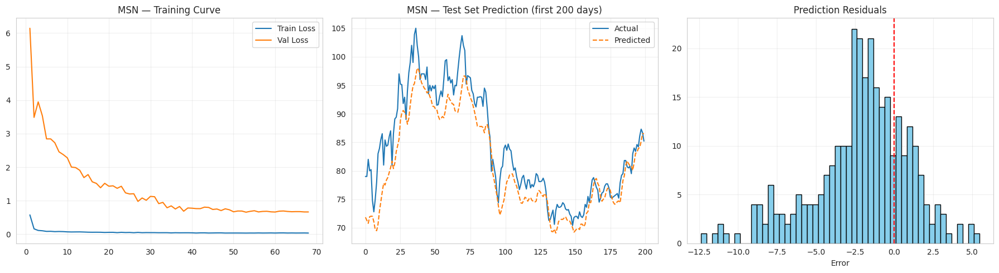

  MSN -> Latest Actual: 67.00  |  Predicted: 68.62  |  Error: 1.62
  Naive baseline MAE: 1.417377  |  Model MAE: 2.847425

  Training Task 2.1 — HPG  (Improved)
Epoch 1/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.9763 - val_loss: 1.4028 - learning_rate: 0.0010
Epoch 2/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.2813 - val_loss: 0.5765 - learning_rate: 0.0010
Epoch 3/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1675 - val_loss: 0.5740 - learning_rate: 0.0010
Epoch 4/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.1377 - val_loss: 0.4330 - learning_rate: 0.0010
Epoch 5/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0995 - val_loss: 0.3224 - learning_rate: 0.0010
Epoch 6/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0967 - val_loss: 0.2627 - learning_rate: 0.0010
Epoch 7/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0809 - val_loss: 0.2880 - learning_rate: 0.0010
Epoch 8/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0782 -

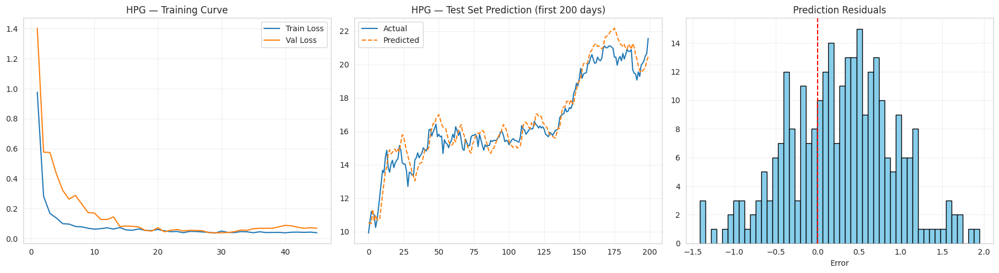

  HPG -> Latest Actual: 20.78  |  Predicted: 21.06  |  Error: 0.28
  Naive baseline MAE: 0.282660  |  Model MAE: 0.563976

  Training Task 2.1 — MBB  (Improved)
Epoch 1/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.7202 - val_loss: 3.5584 - learning_rate: 0.0010
Epoch 2/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.1940 - val_loss: 1.0465 - learning_rate: 0.0010
Epoch 3/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1387 - val_loss: 0.6226 - learning_rate: 0.0010
Epoch 4/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.1066 - val_loss: 0.5142 - learning_rate: 0.0010
Epoch 5/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0849 - val_loss: 0.3212 - learning_rate: 0.0010
Epoch 6/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0935 - val_loss: 0.2363 - learning_rate: 0.0010
Epoch 7/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.0809 - val_loss: 0.1924 - learning_rate: 0.0010
Epoch 8/200
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.0709 - 

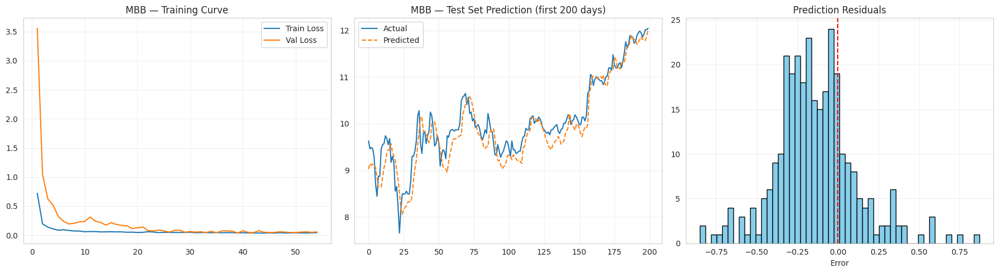

  MBB -> Latest Actual: 11.89  |  Predicted: 11.67  |  Error: -0.22
  Naive baseline MAE: 0.126820  |  Model MAE: 0.226194

  Training Task 2.1 — BID  (Improved)
Epoch 1/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.2415 - val_loss: 0.1401 - learning_rate: 0.0010
Epoch 2/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.1169 - val_loss: 0.1280 - learning_rate: 0.0010
Epoch 3/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0928 - val_loss: 0.1444 - learning_rate: 0.0010
Epoch 4/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0746 - val_loss: 0.1038 - learning_rate: 0.0010
Epoch 5/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0787 - val_loss: 0.1174 - learning_rate: 0.0010
Epoch 6/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0755 - val_loss: 0.1259 - learning_rate: 0.0010
Epoch 7/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0693 - val_loss: 0.0935 - learning_rate: 0.0010
Epoch 8/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0626 

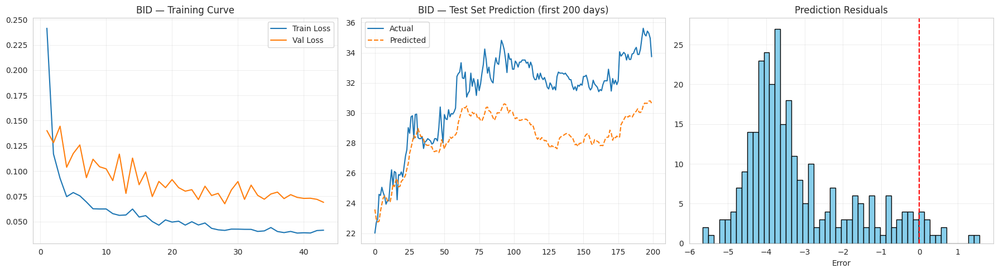

  BID -> Latest Actual: 35.48  |  Predicted: 31.18  |  Error: -4.30
  Naive baseline MAE: 0.430067  |  Model MAE: 3.182033

  Training Task 2.1 — VIC  (Improved)
Epoch 1/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.9094 - val_loss: 0.1097 - learning_rate: 0.0010
Epoch 2/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.1459 - val_loss: 0.1341 - learning_rate: 0.0010
Epoch 3/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.1359 - val_loss: 0.0644 - learning_rate: 0.0010
Epoch 4/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0923 - val_loss: 0.0332 - learning_rate: 0.0010
Epoch 5/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0873 - val_loss: 0.0414 - learning_rate: 0.0010
Epoch 6/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0770 - val_loss: 0.0448 - learning_rate: 0.0010
Epoch 7/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0696 - val_loss: 0.0335 - learning_rate: 0.0010
Epoch 8/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0698 

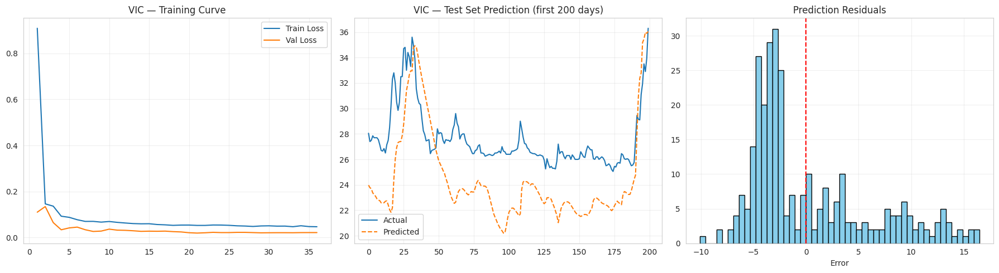

  VIC -> Latest Actual: 22.30  |  Predicted: 20.24  |  Error: -2.06
  Naive baseline MAE: 0.413255  |  Model MAE: 4.758580

  Training Task 2.1 — VCB  (Improved)
Epoch 1/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.5140 - val_loss: 0.2943 - learning_rate: 0.0010
Epoch 2/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.1461 - val_loss: 0.0330 - learning_rate: 0.0010
Epoch 3/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.1038 - val_loss: 0.0520 - learning_rate: 0.0010
Epoch 4/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0849 - val_loss: 0.0886 - learning_rate: 0.0010
Epoch 5/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0855 - val_loss: 0.0231 - learning_rate: 0.0010
Epoch 6/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0790 - val_loss: 0.0304 - learning_rate: 0.0010
Epoch 7/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0700 - val_loss: 0.0398 - learning_rate: 0.0010
Epoch 8/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0693 

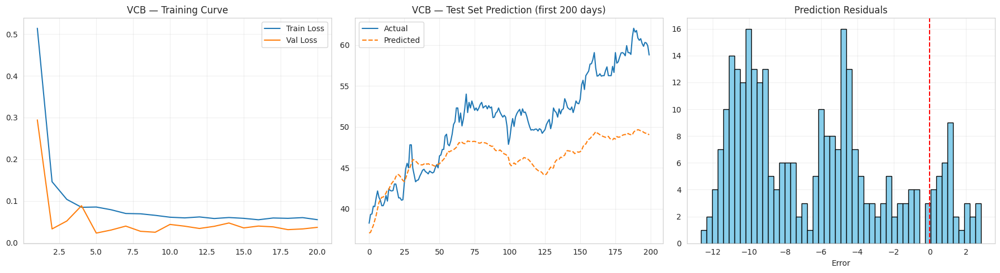

  VCB -> Latest Actual: 53.33  |  Predicted: 45.79  |  Error: -7.54
  Naive baseline MAE: 0.573311  |  Model MAE: 6.617818

  Training Task 2.1 — PLX  (Improved)
Epoch 1/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step - loss: 0.5150 - val_loss: 1.5391 - learning_rate: 0.0010
Epoch 2/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.2527 - val_loss: 0.8591 - learning_rate: 0.0010
Epoch 3/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.2200 - val_loss: 0.7446 - learning_rate: 0.0010
Epoch 4/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.1784 - val_loss: 0.7210 - learning_rate: 0.0010
Epoch 5/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.1668 - val_loss: 0.6574 - learning_rate: 0.0010
Epoch 6/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.1514 - val_loss: 0.5483 - learning_rate: 0.0010
Epoch 7/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.1606 - val_loss: 0.4971 - learning_rate: 0.0010
Epoch 8/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.1509 

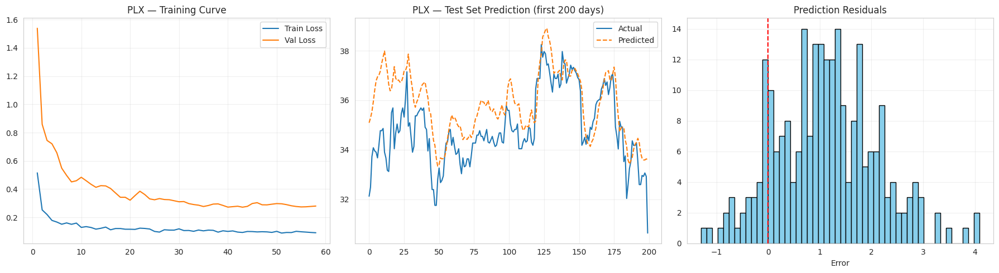

  PLX -> Latest Actual: 32.12  |  Predicted: 33.90  |  Error: 1.78
  Naive baseline MAE: 0.391707  |  Model MAE: 1.215280

  Training Task 2.1 — GAS  (Improved)
Epoch 1/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.3615 - val_loss: 0.5098 - learning_rate: 0.0010
Epoch 2/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.1398 - val_loss: 0.4017 - learning_rate: 0.0010
Epoch 3/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.1054 - val_loss: 0.6184 - learning_rate: 0.0010
Epoch 4/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0970 - val_loss: 0.5096 - learning_rate: 0.0010
Epoch 5/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0996 - val_loss: 0.3973 - learning_rate: 0.0010
Epoch 6/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0845 - val_loss: 0.4264 - learning_rate: 0.0010
Epoch 7/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.0795 - val_loss: 0.4118 - learning_rate: 0.0010
Epoch 8/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.0791 -

GAS_naive                       RMSE=1.0401  MAE=0.7471  DirectionAcc=45.30%
GAS                             RMSE=4.2093  MAE=3.8286  DirectionAcc=46.31%


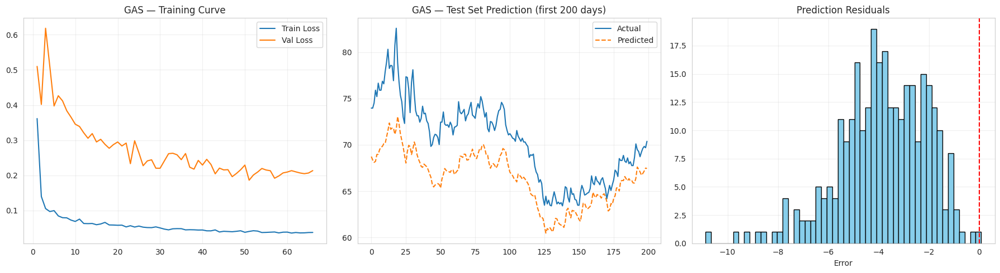

  GAS -> Latest Actual: 64.74  |  Predicted: 62.92  |  Error: -1.82
  Naive baseline MAE: 0.747057  |  Model MAE: 3.828600

  Training Task 2.1 — FPT  (Improved)
Epoch 1/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.7152 - val_loss: 3.8260 - learning_rate: 0.0010
Epoch 2/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.2043 - val_loss: 1.3744 - learning_rate: 0.0010
Epoch 3/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.1456 - val_loss: 1.0071 - learning_rate: 0.0010
Epoch 4/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.1029 - val_loss: 1.0512 - learning_rate: 0.0010
Epoch 5/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0881 - val_loss: 0.7436 - learning_rate: 0.0010
Epoch 6/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0765 - val_loss: 0.5792 - learning_rate: 0.0010
Epoch 7/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0726 - val_loss: 0.5089 - learning_rate: 0.0010
Epoch 8/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0641 

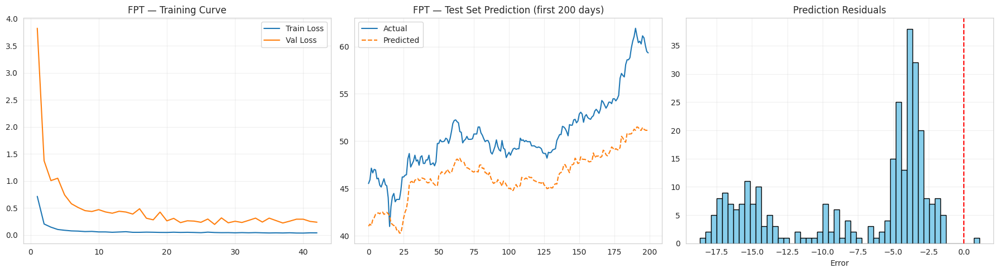

  FPT -> Latest Actual: 70.34  |  Predicted: 53.47  |  Error: -16.87
  Naive baseline MAE: 0.541980  |  Model MAE: 7.787986

  Training Task 2.1 — VNM  (Improved)
Epoch 1/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.5311 - val_loss: 0.0407 - learning_rate: 0.0010
Epoch 2/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.1981 - val_loss: 0.0973 - learning_rate: 0.0010
Epoch 3/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.1496 - val_loss: 0.0225 - learning_rate: 0.0010
Epoch 4/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.1139 - val_loss: 0.0234 - learning_rate: 0.0010
Epoch 5/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1135 - val_loss: 0.0183 - learning_rate: 0.0010
Epoch 6/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.1077 - val_loss: 0.0162 - learning_rate: 0.0010
Epoch 7/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0897 - val_loss: 0.0192 - learning_rate: 0.0010
Epoch 8/200
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.0900

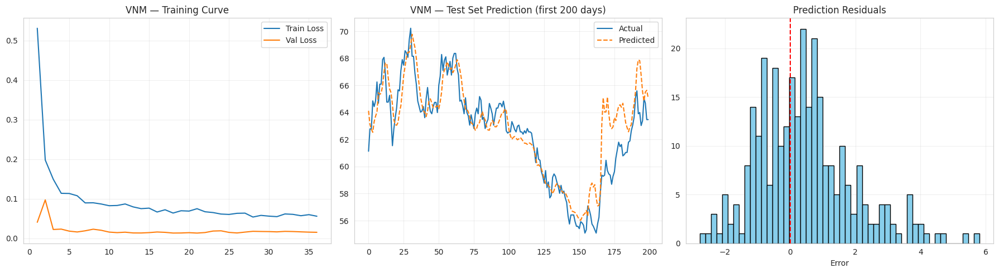

  VNM -> Latest Actual: 59.13  |  Predicted: 59.64  |  Error: 0.51
  Naive baseline MAE: 0.637993  |  Model MAE: 1.148846

 COMBINED PREDICTIONS – Last 5 Days for Each Ticker

--- MSN ---
               Date  Actual  Predicted  Error
2023-12-25 07:00:00   66.40      64.70  -1.70
2023-12-26 07:00:00   66.20      66.45   0.25
2023-12-27 07:00:00   67.00      67.35   0.35
2023-12-28 07:00:00   67.00      68.26   1.26
2023-12-29 07:00:00   67.00      68.62   1.62

--- HPG ---
               Date  Actual  Predicted  Error
2023-12-25 07:00:00   20.40      20.20  -0.20
2023-12-26 07:00:00   20.66      20.37  -0.29
2023-12-27 07:00:00   20.63      20.77   0.14
2023-12-28 07:00:00   20.78      20.83   0.05
2023-12-29 07:00:00   20.78      21.06   0.28

--- MBB ---
               Date  Actual  Predicted  Error
2023-12-25 07:00:00   11.73      11.45  -0.28
2023-12-26 07:00:00   11.76      11.50  -0.26
2023-12-27 07:00:00   11.73      11.49  -0.24
2023-12-28 07:00:00   11.83      11.52  -0.31
2023

In [17]:
# 1. Improved data normalisation
def normalise_windows_standard(X_tr, y_tr, X_v, y_v, X_te, y_te):
    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    X_tr_shape = X_tr.shape
    X_tr_flat = X_tr.reshape(-1, X_tr_shape[-1])
    scaler_X.fit(X_tr_flat)
    scaler_y.fit(y_tr.reshape(-1, 1))

    X_tr_norm = scaler_X.transform(X_tr_flat).reshape(X_tr_shape)
    X_v_norm  = scaler_X.transform(X_v.reshape(-1, X_v.shape[-1])).reshape(X_v.shape)
    X_te_norm = scaler_X.transform(X_te.reshape(-1, X_te.shape[-1])).reshape(X_te.shape)

    y_tr_norm = scaler_y.transform(y_tr.reshape(-1, 1)).flatten()
    y_v_norm  = scaler_y.transform(y_v.reshape(-1, 1)).flatten()
    y_te_norm = scaler_y.transform(y_te.reshape(-1, 1)).flatten()

    return (X_tr_norm, y_tr_norm, X_v_norm, y_v_norm,
            X_te_norm, y_te_norm, scaler_X, scaler_y)

def denorm(y_norm, scaler_y):
    return scaler_y.inverse_transform(y_norm.reshape(-1, 1)).flatten()

# 2. Simpler, regularised LSTM model
def build_improved_lstm(window_size, n_features, horizon=1):
    model = Sequential([
        LSTM(50, dropout=0.2, recurrent_dropout=0.2,
             kernel_regularizer=l2(1e-4),
             input_shape=(window_size, n_features)),
        Dropout(0.2),
        Dense(horizon, kernel_regularizer=l2(1e-4), use_bias=True)
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

# 3. Callbacks
def get_improved_callbacks(ticker):
    early_stop = EarlyStopping(monitor='val_loss', patience=15,
                               restore_best_weights=True, verbose=1)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                                  patience=5, min_lr=1e-6, verbose=1)
    return [early_stop, reduce_lr]

# 4. Naive baseline
def naive_baseline(X_te, feature_names, target_col='Close'):
    try:
        target_idx = feature_names.index(target_col)
    except ValueError:
        print("Warning: target column not found in features, skipping baseline.")
        return None
    return X_te[:, -1, target_idx]  # last known value of the target

# 5. Main training loop with clean prediction printout
task21_results = {}
all_pred_dfs = []          # will hold prediction DataFrames for each ticker
loss_tables = {}           # will hold loss history DataFrames for each ticker

for ticker in STOCK_LIST:
    if ticker not in enriched_data:
        continue
    df = enriched_data[ticker]
    print(f"\n{'='*60}")
    print(f"  Training Task 2.1 — {ticker}  (Improved)")
    print(f"{'='*60}")

    # Data preparation
    X, y = make_windows_multifeature(df, MULTI_FEATURES, TARGET_COL,
                                     window=WINDOW_SIZE, horizon=1)
    X_tr, y_tr, X_v, y_v, X_te, y_te = ts_split(X, y)

    # Normalise
    X_tr_n, y_tr_n, X_v_n, y_v_n, X_te_n, y_te_n, scaler_X, scaler_y = \
        normalise_windows_standard(X_tr, y_tr, X_v, y_v, X_te, y_te)

    # Model
    model = build_improved_lstm(WINDOW_SIZE, len(MULTI_FEATURES), horizon=1)
    history = model.fit(
        X_tr_n, y_tr_n,
        validation_data=(X_v_n, y_v_n),
        epochs=200,
        batch_size=128,
        callbacks=get_improved_callbacks(ticker),
        verbose=1
    )

    # Predict & denormalise
    y_pred_norm = model.predict(X_te_n, verbose=0).flatten()
    y_pred = denorm(y_pred_norm, scaler_y)
    y_true = denorm(y_te_n, scaler_y)

    # --- Naive baseline ---
    baseline_pred = naive_baseline(X_te, MULTI_FEATURES, TARGET_COL)
    if baseline_pred is not None:
        baseline_metrics = evaluate(y_true, baseline_pred, label=f'{ticker}_naive')

    # --- Evaluation ---
    metrics = evaluate(y_true, y_pred, label=ticker)
    task21_results[ticker] = {
        'model': model, 'metrics': metrics,
        'y_true': y_true, 'y_pred': y_pred,
        'df': df, 'history': history, 'scaler_y': scaler_y
    }

    #  BUILD PREDICTION DATAFRAME WITH DATES
    # Determine test set dates
    # Windows are created from df; each window predicts the next day.
    # Total number of windows = len(df) - WINDOW_SIZE
    # After ts_split, y_te corresponds to the last portion.
    # Ensure df has a datetime index to slice correctly
    if 'date' in df.columns:
        df = df.set_index('date')
    target_dates = df.index[WINDOW_SIZE:]          # all possible target dates
    test_dates = target_dates[-len(y_true):]       # last len(y_true) are test set
    # Sanity check
    if len(test_dates) != len(y_true):
        print(f"WARNING: Date/y_true length mismatch for {ticker}: "
              f"{len(test_dates)} vs {len(y_true)}")
        test_dates = test_dates[:len(y_true)]      # trim if necessary

    pred_df = pd.DataFrame({
        'Date': test_dates,
        'Actual': y_true,
        'Predicted': y_pred,
        'Error': y_pred - y_true
    }).set_index('Date')

    # Store for later concatenation
    pred_df['Ticker'] = ticker
    all_pred_dfs.append(pred_df)

    # SAVE LOSS HISTORY FOR COMBINED TABLE
    loss_df = pd.DataFrame({
        'epoch': range(1, len(history.history['loss']) + 1),
        'train_loss': history.history['loss'],
        'val_loss': history.history['val_loss']
    }).set_index('epoch')
    loss_tables[ticker] = loss_df

    # Plot (unchanged)
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    axes[0].plot(loss_df.index, loss_df['train_loss'], label='Train Loss')
    axes[0].plot(loss_df.index, loss_df['val_loss'], label='Val Loss')
    axes[0].set_title(f'{ticker} — Training Curve')
    axes[0].legend(); axes[0].grid(alpha=0.3)

    axes[1].plot(y_true[:200], label='Actual', lw=1.5)
    axes[1].plot(y_pred[:200], label='Predicted', lw=1.5, ls='--')
    axes[1].set_title(f'{ticker} — Test Set Prediction (first 200 days)')
    axes[1].legend(); axes[1].grid(alpha=0.3)

    residuals = y_pred - y_true
    axes[2].hist(residuals, bins=50, color='skyblue', edgecolor='black')
    axes[2].axvline(x=0, color='red', linestyle='--')
    axes[2].set_title('Prediction Residuals')
    axes[2].set_xlabel('Error'); axes[2].grid(alpha=0.3)

    plt.tight_layout(); plt.show()

    # Quick print of the most recent prediction for this ticker
    last_row = pred_df.iloc[-1]
    print(f"  {ticker} -> Latest Actual: {last_row['Actual']:.2f}  |  " +
          f"Predicted: {last_row['Predicted']:.2f}  |  Error: {last_row['Error']:.2f}")
    if baseline_pred is not None:
        print(f"  Naive baseline MAE: {baseline_metrics['mae']:.6f}  |  Model MAE: {metrics['mae']:.6f}")

# AFTER THE LOOP – COMBINED TABLES
if all_pred_dfs:
    # Combine all prediction DataFrames
    combined_preds = pd.concat(all_pred_dfs)

    #  1. PRINT LAST N PREDICTIONS FOR EACH TICKER
    print("\n" + "="*100)
    print(" COMBINED PREDICTIONS – Last 5 Days for Each Ticker")
    print("="*100)
    for ticker in STOCK_LIST:
        if ticker in combined_preds['Ticker'].unique():
            ticker_data = combined_preds[combined_preds['Ticker'] == ticker].copy()
            # Show last 5 rows (most recent dates)
            display_df = ticker_data.tail(5).reset_index()
            # Reorder columns for readability
            display_df = display_df[['Date', 'Actual', 'Predicted', 'Error']]
            # Print with formatted floats
            print(f"\n--- {ticker} ---")
            print(display_df.to_string(index=False, float_format=lambda x: f"{x:.2f}"))

    #  2. SAVE FULL PREDICTIONS TO CSV
    combined_preds.to_csv('task21_predictions_all_companies.csv', float_format='%.6f')
    print("\nFull predictions saved to task21_predictions_all_companies.csv")

    #  3. PRINT A COMBINED LOSS TABLE (if desired)
    print("\n" + "="*100)
    print(" TRAINING LOSS SUMMARY – Final Loss for Each Ticker")
    print("="*100)
    final_loss_rows = []
    for ticker, loss_df in loss_tables.items():
        final_loss_rows.append({
            'Ticker': ticker,
            'Final Train Loss': loss_df['train_loss'].iloc[-1],
            'Final Val Loss': loss_df['val_loss'].iloc[-1],
            'Epochs Trained': len(loss_df)
        })
    final_loss_df = pd.DataFrame(final_loss_rows)
    print(final_loss_df.to_string(index=False, float_format=lambda x: f"{x:.6f}"))


### Task 2.2 - K-th day forecast (single specific future day)


  MSN: predicting day +7

Epoch 26: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 58: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 63: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.

Epoch 68: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
Epoch 68: early stopping
Restoring model weights from the end of the best epoch: 53.
MSN day+7                       RMSE=5.1405  MAE=4.0516  DirectionAcc=42.14%


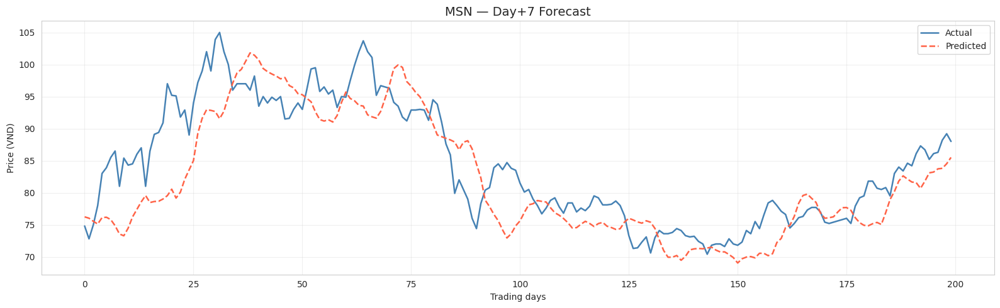


  HPG: predicting day +7

Epoch 21: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 26: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 31: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
Epoch 31: early stopping
Restoring model weights from the end of the best epoch: 16.
HPG day+7                       RMSE=1.3419  MAE=1.0616  DirectionAcc=43.81%


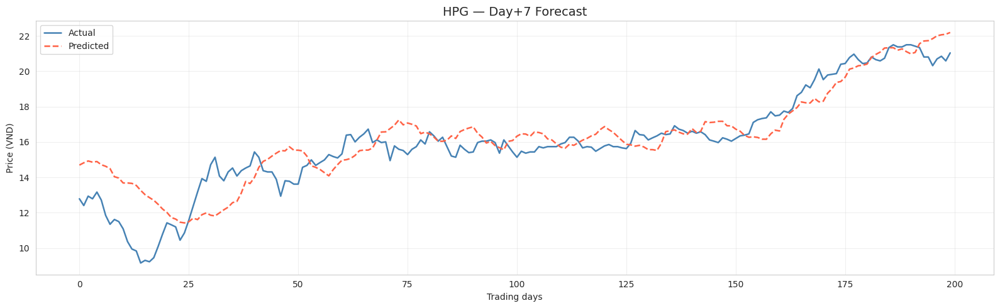


  MBB: predicting day +7

Epoch 23: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 31: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 36: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.

Epoch 41: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
Epoch 41: early stopping
Restoring model weights from the end of the best epoch: 26.
MBB day+7                       RMSE=0.6380  MAE=0.4991  DirectionAcc=40.80%


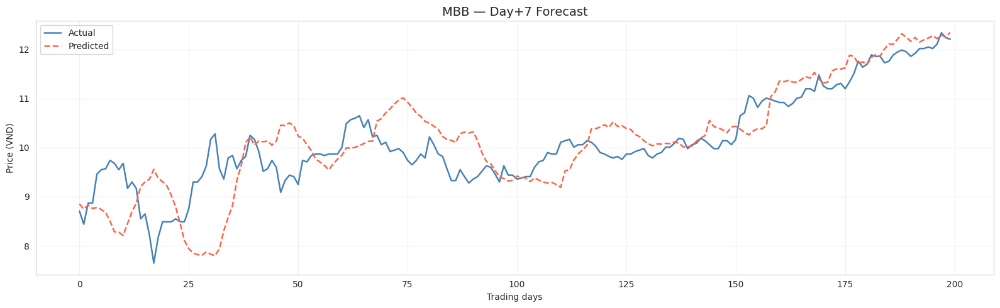


  BID: predicting day +7

Epoch 11: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 16: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 21: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
Epoch 21: early stopping
Restoring model weights from the end of the best epoch: 6.
BID day+7                       RMSE=5.6015  MAE=5.2931  DirectionAcc=50.34%


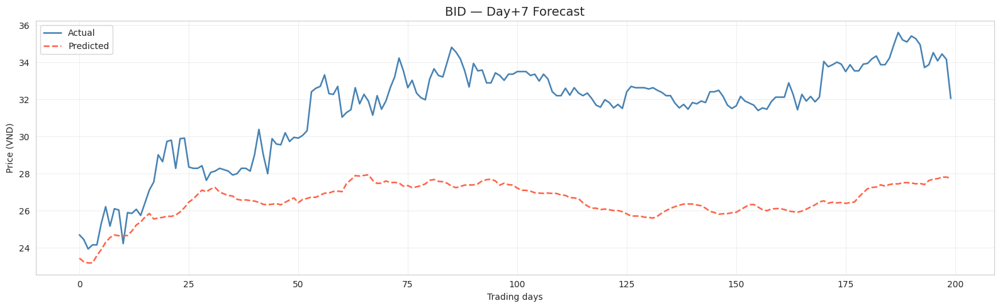


  VIC: predicting day +7

Epoch 21: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 26: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 31: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
Epoch 31: early stopping
Restoring model weights from the end of the best epoch: 16.
VIC day+7                       RMSE=6.5922  MAE=5.2456  DirectionAcc=48.11%


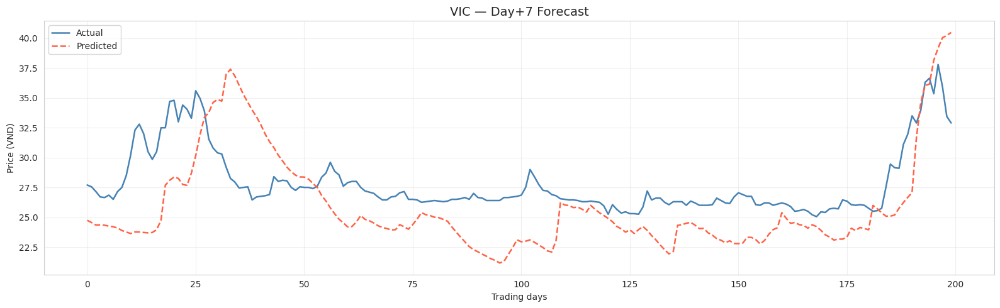


  VCB: predicting day +7

Epoch 16: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 21: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 26: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
Epoch 26: early stopping
Restoring model weights from the end of the best epoch: 11.
VCB day+7                       RMSE=7.6230  MAE=6.8300  DirectionAcc=48.63%


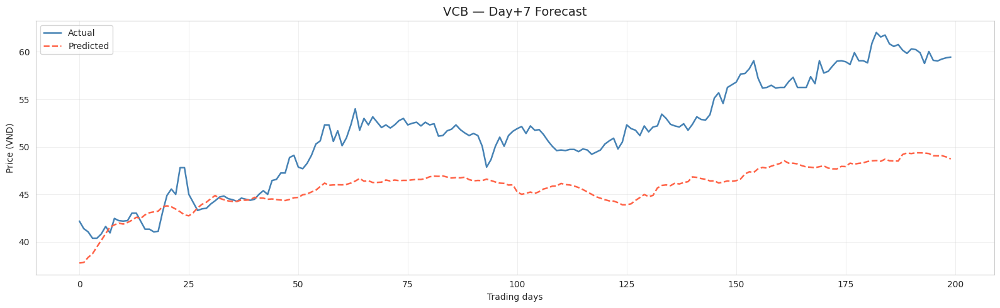


  PLX: predicting day +7

Epoch 18: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 23: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 28: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
Epoch 28: early stopping
Restoring model weights from the end of the best epoch: 13.
PLX day+7                       RMSE=2.0561  MAE=1.7449  DirectionAcc=41.25%


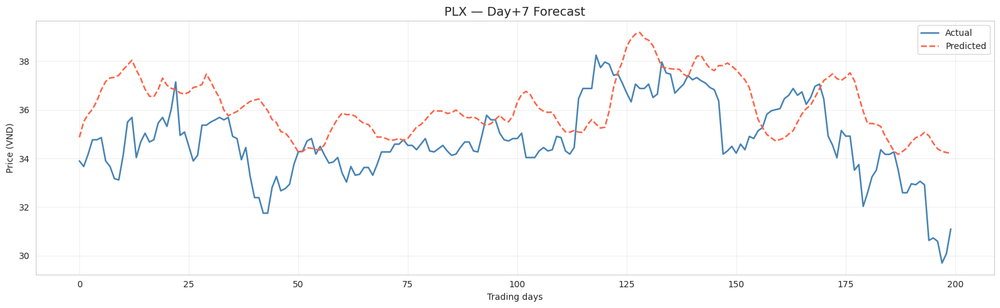


  GAS: predicting day +7

Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 12: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 17: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
Epoch 17: early stopping
Restoring model weights from the end of the best epoch: 2.
GAS day+7                       RMSE=4.1255  MAE=3.1760  DirectionAcc=48.97%


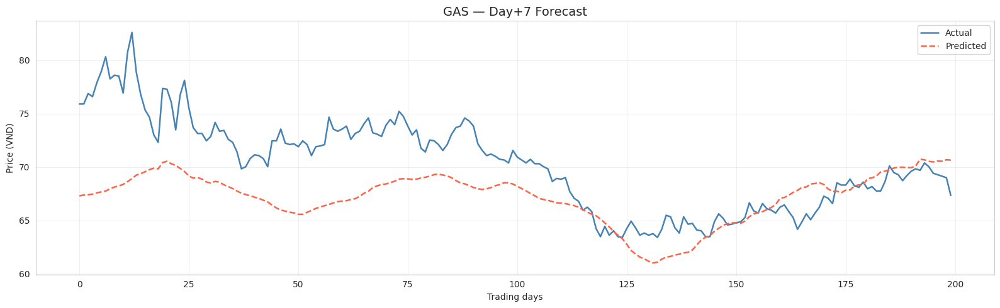


  FPT: predicting day +7

Epoch 19: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 24: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 29: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
Epoch 29: early stopping
Restoring model weights from the end of the best epoch: 14.
FPT day+7                       RMSE=10.4002  MAE=8.0449  DirectionAcc=42.61%


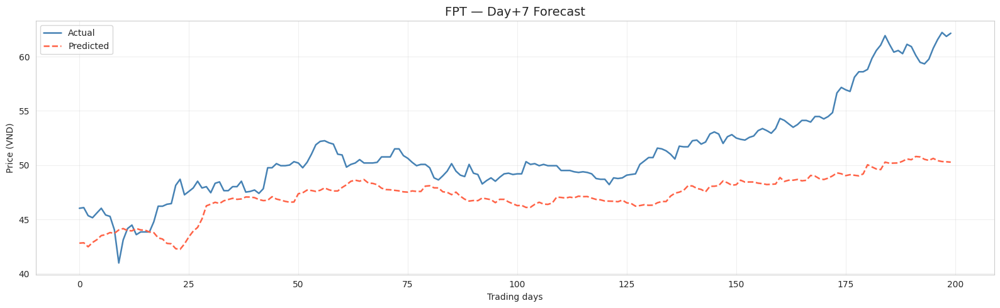


  VNM: predicting day +7

Epoch 11: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 21: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 29: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.

Epoch 34: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.

Epoch 39: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.
Epoch 39: early stopping
Restoring model weights from the end of the best epoch: 24.
VNM day+7                       RMSE=2.3504  MAE=1.8680  DirectionAcc=43.49%


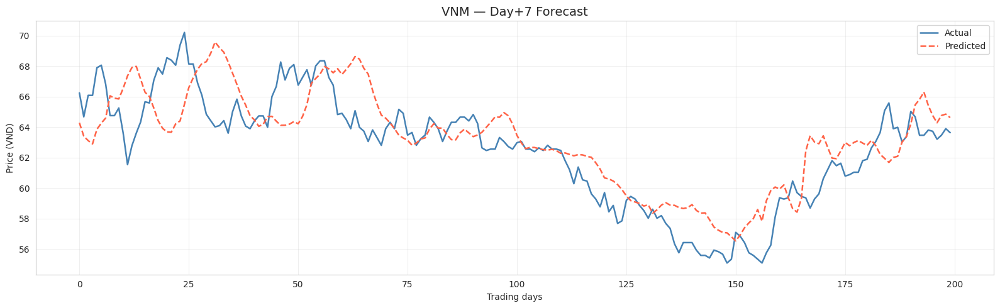

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from numpy.lib.stride_tricks import sliding_window_view

def train_kth_day_model(ticker: str, df: pd.DataFrame, k: int = 7,
                        feature_cols=MULTI_FEATURES, window=WINDOW_SIZE):
    """
    Task 2.2 – Optimised: predict close price k days ahead.
    """
    print(f"\n  {ticker}: predicting day +{k}")

    # Extract arrays
    data = df[feature_cols].values.astype(np.float32)
    target = df['close'].values.astype(np.float32)

    # ---------- Vectorised window creation ----------
    # X: all windows of shape (N, window, n_features)
    X_all = sliding_window_view(data, window_shape=(window, data.shape[1]))
    X_all = X_all.squeeze(1)  # shape (samples, window, features)

    # y shifted by k: target at index window + k - 1
    # We need to align X and y: X starts at 0, y at index (window + k - 1)
    # Decrease X length to match y
    X = X_all[:len(X_all) - k]                    # (samples, window, features)
    y = target[window + k - 1 : window + k - 1 + len(X)]  # shape (samples,)

    # ---------- Chronological split ----------
    X_tr, y_tr, X_v, y_v, X_te, y_te = ts_split(X, y)

    # ---------- Scale using StandardScaler ----------
    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    # Flatten X for scaling (fit only on train)
    X_tr_reshaped = X_tr.reshape(-1, X_tr.shape[-1])
    scaler_X.fit(X_tr_reshaped)
    X_tr_sc = scaler_X.transform(X_tr_reshaped).reshape(X_tr.shape)
    X_v_sc  = scaler_X.transform(X_v.reshape(-1, X_v.shape[-1])).reshape(X_v.shape)
    X_te_sc = scaler_X.transform(X_te.reshape(-1, X_te.shape[-1])).reshape(X_te.shape)

    scaler_y.fit(y_tr.reshape(-1, 1))
    y_tr_sc = scaler_y.transform(y_tr.reshape(-1, 1)).flatten()
    y_v_sc  = scaler_y.transform(y_v.reshape(-1, 1)).flatten()
    y_te_sc = scaler_y.transform(y_te.reshape(-1, 1)).flatten()

    # ---------- Regularised LSTM ----------
    model = build_improved_lstm(window, len(feature_cols), horizon=1)  # use earlier improved version
    history = model.fit(
        X_tr_sc, y_tr_sc,
        validation_data=(X_v_sc, y_v_sc),
        epochs=100, batch_size=128,
        callbacks=get_improved_callbacks(f'{ticker}_k{k}'),
        verbose=0
    )

    # ---------- Predict & inverse transform ----------
    y_pred_sc = model.predict(X_te_sc, verbose=0).flatten()
    y_pred = scaler_y.inverse_transform(y_pred_sc.reshape(-1, 1)).flatten()
    y_true = scaler_y.inverse_transform(y_te_sc.reshape(-1, 1)).flatten()

    evaluate(y_true, y_pred, label=f"{ticker} day+{k}")

    # ---------- Optional: add dates for plotting/table ----------
    # Test dates: start = window + k - 1 + len(y_tr) + len(y_v)
    test_start = window + k - 1 + len(y_tr) + len(y_v)
    test_dates = df.index[test_start : test_start + len(y_true)]

    return model, y_true, y_pred, test_dates
    # Run Task 2.2 for k=7 on all tickers
K_SPECIFIC = 7
task22_results = {}

for ticker in STOCK_LIST:
    if ticker not in enriched_data:
        continue
    model, y_true, y_pred, test_dates = train_kth_day_model(
        ticker, enriched_data[ticker], k=K_SPECIFIC)
    task22_results[ticker] = {'model': model, 'y_true': y_true, 'y_pred': y_pred}
    plot_predictions(y_true[:200], y_pred[:200],
                     title=f'{ticker} — Day+{K_SPECIFIC} Forecast')

### Task 2.3 - K days forecast

In [ ]:
#  UTILITY FUNCTIONS (unified, clash‑free)
def filter_companies(data_dict, min_points=MIN_ROWS):
    return {t: d for t, d in data_dict.items() if len(d) >= min_points}

def make_windows(data_array, target_array, window, horizon=1,
                 k_consecutive=False):
    """Vectorised window creation (NumPy strides)."""
    X_all = sliding_window_view(data_array,
                                window_shape=(window, data_array.shape[1]))
    X_all = X_all.squeeze(1)   # (n_windows, window, features)

    if k_consecutive:
        # y: window of `horizon` days starting right after input window
        y = sliding_window_view(target_array, horizon)[window:]
        X = X_all[:len(y)]
    else:
        start_y = window + horizon - 1
        y = target_array[start_y : start_y + len(X_all)]
        X = X_all[:len(y)]
    return X.astype(np.float32), y.astype(np.float32)

def ts_split(X, y, val_frac=0.15, test_frac=0.15):
    n = len(X)
    n_test = int(n * test_frac)
    n_val  = int(n * val_frac)
    n_train = n - n_val - n_test
    return (X[:n_train], y[:n_train],
            X[n_train:n_train+n_val], y[n_train:n_train+n_val],
            X[n_train+n_val:], y[n_train+n_val:])

def scale_data(X_tr, y_tr, X_va, y_va, X_te, y_te, y_multidim=False):
    """Standard scaling using training set statistics."""
    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    X_tr_2d = X_tr.reshape(-1, X_tr.shape[-1])
    scaler_X.fit(X_tr_2d)
    X_tr_s = scaler_X.transform(X_tr_2d).reshape(X_tr.shape)
    X_va_s = scaler_X.transform(X_va.reshape(-1, X_va.shape[-1])).reshape(X_va.shape)
    X_te_s = scaler_X.transform(X_te.reshape(-1, X_te.shape[-1])).reshape(X_te.shape)

    if y_multidim:
        scaler_y.fit(y_tr)
        y_tr_s = scaler_y.transform(y_tr)
        y_va_s = scaler_y.transform(y_va)
        y_te_s = scaler_y.transform(y_te)
    else:
        scaler_y.fit(y_tr.reshape(-1, 1))
        y_tr_s = scaler_y.transform(y_tr.reshape(-1, 1)).flatten()
        y_va_s = scaler_y.transform(y_va.reshape(-1, 1)).flatten()
        y_te_s = scaler_y.transform(y_te.reshape(-1, 1)).flatten()
    return X_tr_s, y_tr_s, X_va_s, y_va_s, X_te_s, y_te_s, scaler_X, scaler_y

def denorm(y_norm, scaler_y):
    if y_norm.ndim == 1:
        return scaler_y.inverse_transform(y_norm.reshape(-1, 1)).flatten()
    return scaler_y.inverse_transform(y_norm)

def build_lstm(window_size, n_features, output_units=1,
               lstm_units=50, dropout_rate=0.2):
    model = Sequential([
        LSTM(lstm_units, dropout=dropout_rate, recurrent_dropout=dropout_rate,
             kernel_regularizer=l2(1e-4),
             input_shape=(window_size, n_features)),
        Dropout(dropout_rate),
        Dense(output_units, kernel_regularizer=l2(1e-4))
    ])
    model.compile(optimizer=Adam(1e-3), loss='mse', metrics=['mae'])
    return model

def get_callbacks(patience=15):
    return [
        EarlyStopping(monitor='val_loss', patience=patience,
                      restore_best_weights=True, verbose=0),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                          patience=5, min_lr=1e-6, verbose=0)
    ]

In [ ]:
# TASK 2.3 – k CONSECUTIVE DAYS FORECAST
results_23 = {}

for tk in STOCK_LIST:
    df = enriched_data.get(tk)
    if df is None: continue

    feat_cols = [c for c in FEATURE_COLS_FULL if c in df.columns]
    # consecutive=True, k=K_DAY  →  output vector of K_DAY prices
    X, y = build_dataset(df, feat_cols, TARGET, WINDOW_SIZE,
                         k=K_DAY, consecutive=True)

    (X_tr, y_tr, X_va, y_va, X_te, y_te) = chronological_split(X, y)
    feat_sc, tgt_sc = fit_scalers(X_tr, y_tr.ravel())

    X_tr_sc, y_tr_sc = apply_scalers(X_tr, y_tr, feat_sc, tgt_sc)
    X_va_sc, y_va_sc = apply_scalers(X_va, y_va, feat_sc, tgt_sc)
    X_te_sc, _       = apply_scalers(X_te, y_te, feat_sc, tgt_sc)

    model, hist, _, _, _ = train_and_evaluate(
        X_tr_sc, y_tr_sc, X_va_sc, y_va_sc,
        X_te_sc, y_te.ravel(), tgt_sc,     # metrics computed below
        output_size=K_DAY, model_name=f'{tk}_23'
    )

    # De-normalise multi-step predictions
    y_pred_sc = model.predict(X_te_sc, verbose=0)          # (N, K_DAY)
    y_pred_all = tgt_scaler_inv = tgt_sc.inverse_transform(
        y_pred_sc.reshape(-1, 1)
    ).reshape(y_pred_sc.shape)
    y_true_all = y_te                                       # (N, K_DAY)

    rmse_per_step = [np.sqrt(mean_squared_error(y_true_all[:,d], y_pred_all[:,d]))
                     for d in range(K_DAY)]
    results_23[tk] = {'model': model, 'feat_sc': feat_sc, 'tgt_sc': tgt_sc,
                      'rmse_steps': rmse_per_step,
                      'y_pred': y_pred_all, 'y_true': y_true_all}

    print(f"{tk:4s}  RMSE/step: {[f'{v:.1f}' for v in rmse_per_step]}")

Companies used: ['MSN', 'HPG', 'MBB', 'BID', 'VIC', 'VCB', 'PLX', 'GAS', 'FPT', 'VNM']

Processing MSN — 2068 rows, 9 features


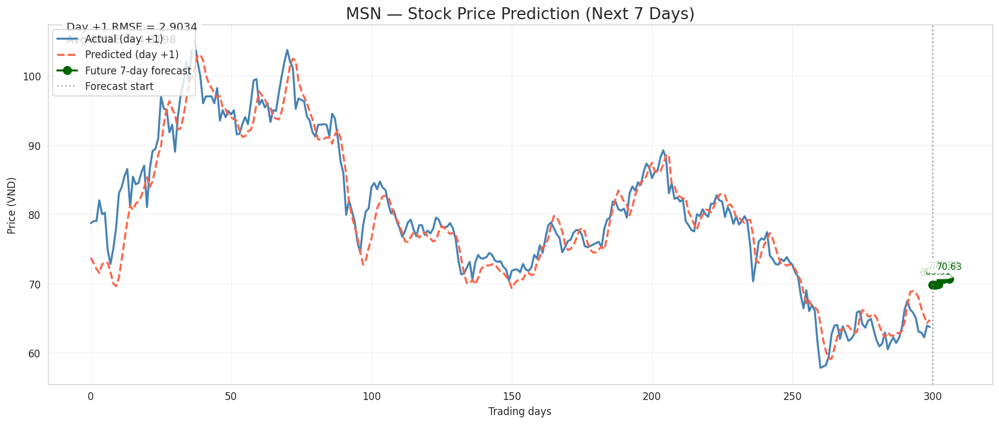


Processing HPG — 2068 rows, 9 features


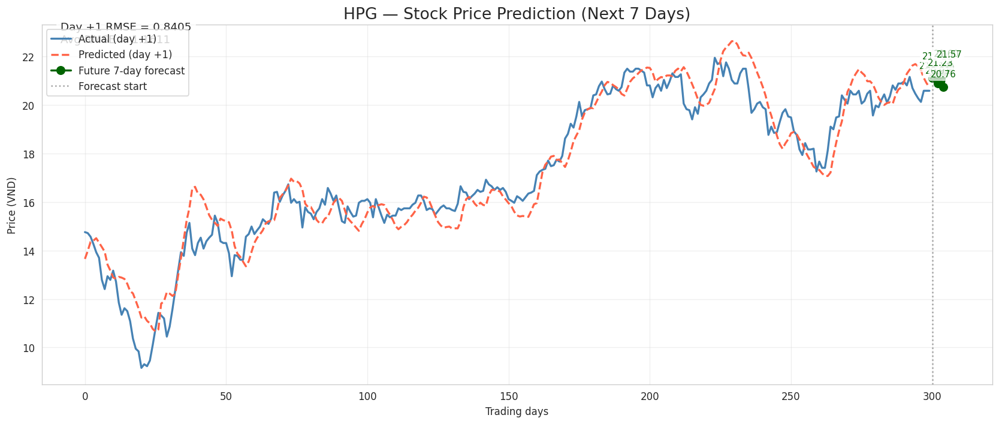


Processing MBB — 2068 rows, 9 features


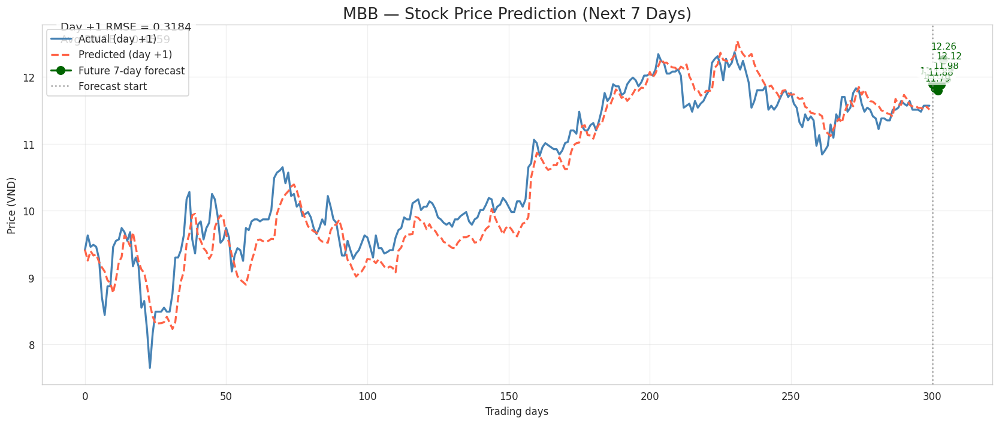


Processing BID — 2025 rows, 9 features


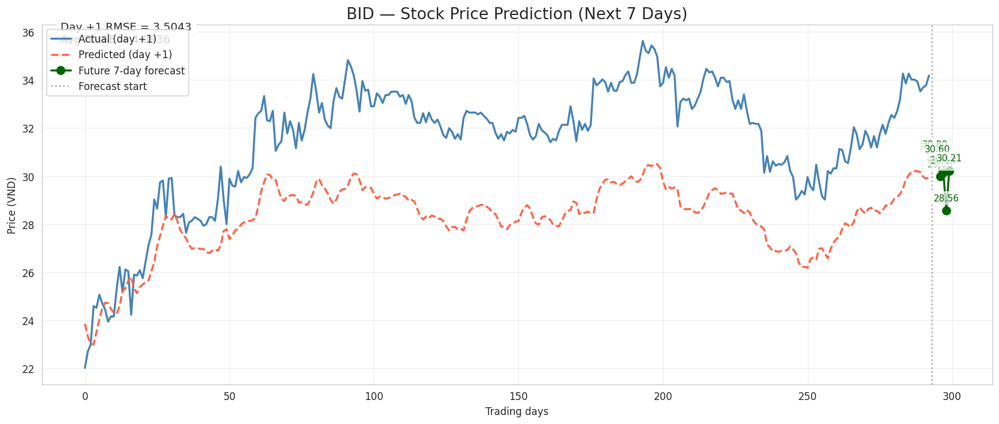


Processing VIC — 2018 rows, 9 features


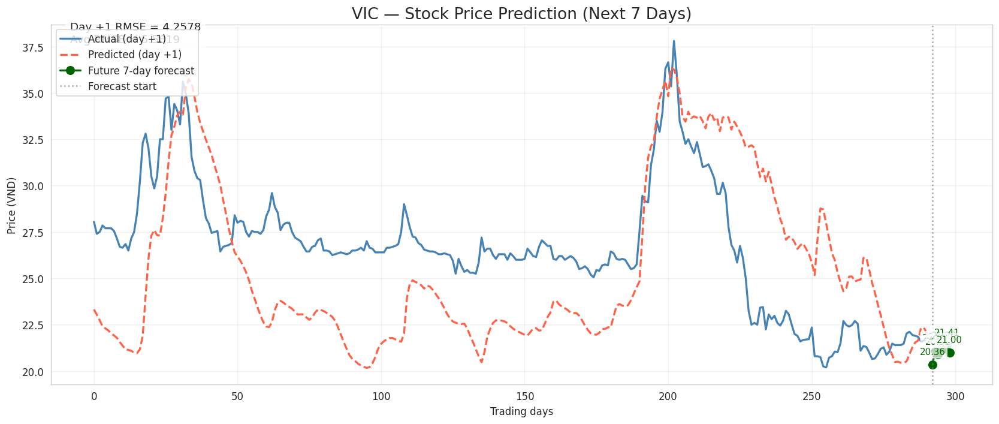


Processing VCB — 2025 rows, 9 features


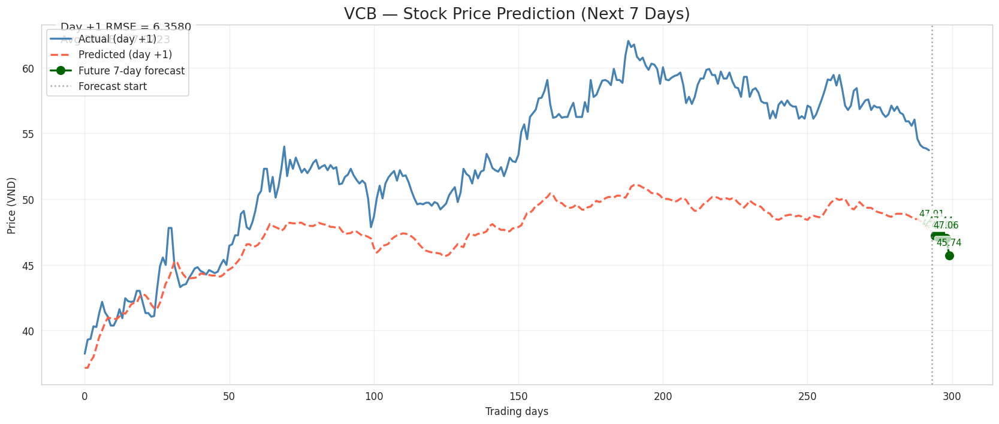


Processing PLX — 1676 rows, 9 features


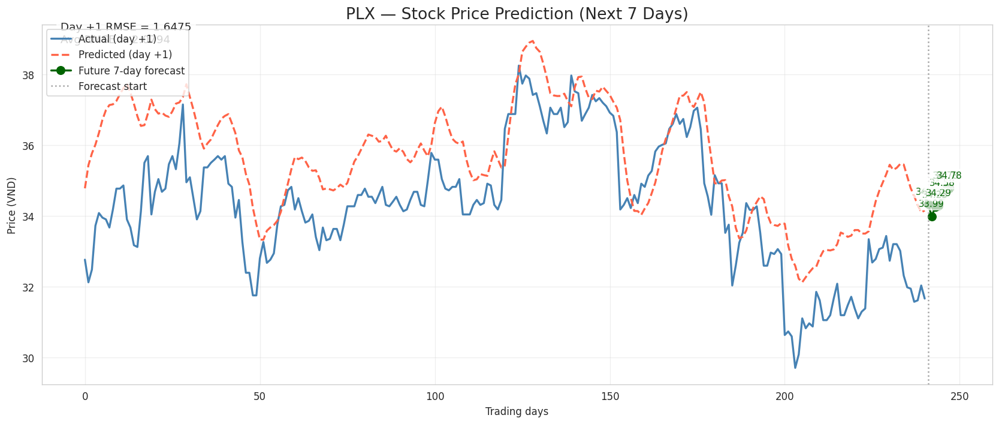


Processing GAS — 2025 rows, 9 features


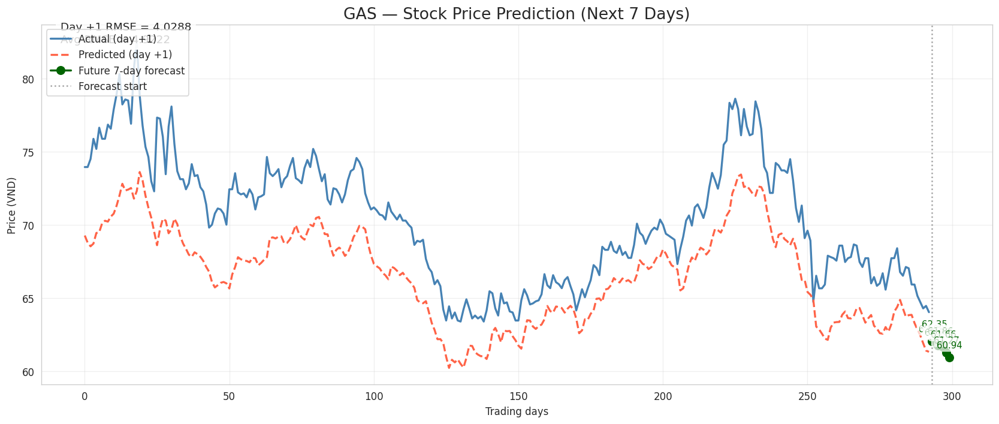


Processing FPT — 2019 rows, 9 features


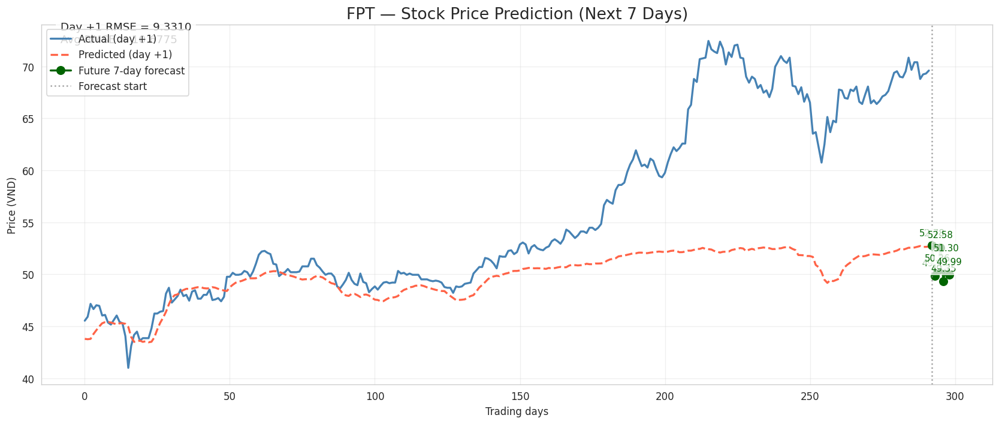


Processing VNM — 2025 rows, 9 features


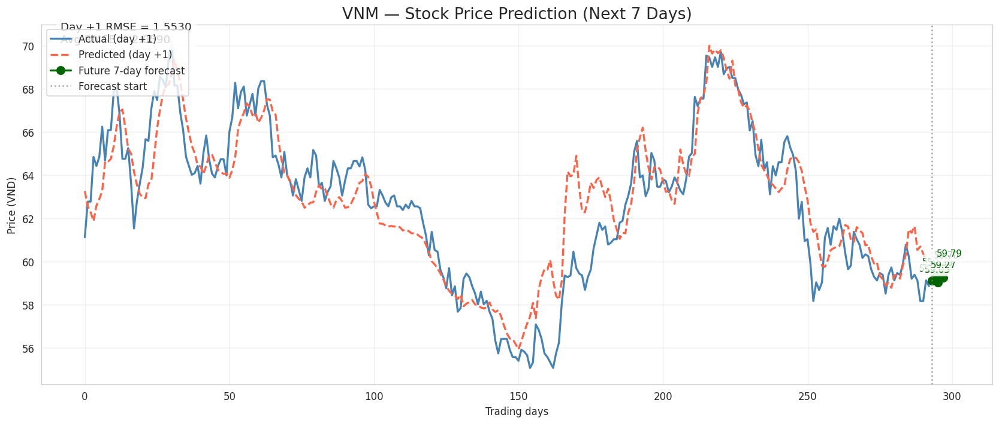

In [ ]:
    # MODEL MAIN FUNCTION
def train_and_plot_k_consecutive(ticker, df, feature_cols, target_col,
                                 window, k):
    data   = df[feature_cols].values.astype(np.float32)
    target = df[target_col].values.astype(np.float32)

    # 1. Multi‑output windows
    X, y = make_windows(data, target, window, horizon=k, k_consecutive=True)

    # 2. Chronological split
    X_tr, y_tr, X_va, y_va, X_te, y_te = ts_split(X, y)

    # 3. Standard scaling
    X_tr_s, y_tr_s, X_va_s, y_va_s, X_te_s, y_te_s, scX, scy = scale_data(
        X_tr, y_tr, X_va, y_va, X_te, y_te, y_multidim=True)

    # 4. Build & train
    model = build_lstm(window, len(feature_cols), output_units=k)
    history = model.fit(
        X_tr_s, y_tr_s,
        validation_data=(X_va_s, y_va_s),
        epochs=150, batch_size=128,
        callbacks=get_callbacks(),
        verbose=0
    )

    # 5. Test predictions
    y_pred_s = model.predict(X_te_s, verbose=0)   # (samples, k)
    y_pred = denorm(y_pred_s, scy)
    y_true = denorm(y_te_s, scy)

    # 6. Future forecast (use last window of entire dataset)
    last_window = data[-window:]                  # (window, n_feats)
    last_window_s = scX.transform(
        last_window.reshape(1, -1).reshape(-1, last_window.shape[-1])
    ).reshape(1, window, -1)
    future_preds = model.predict(last_window_s, verbose=0)  # (1, k)
    future_preds = scy.inverse_transform(future_preds).flatten()

    # 7. Per‑day RMSE
    day_rmse = []
    for d in range(k):
        rmse = np.sqrt(mean_squared_error(y_true[:, d], y_pred[:, d]))
        day_rmse.append(rmse)
    avg_rmse = np.mean(day_rmse)

    # 8. Plot
    n_test = len(y_true)
    days = np.arange(n_test + k)
    fig, ax = plt.subplots(figsize=(14, 6), dpi=120)

    # Actual vs predicted (first predicted day)
    ax.plot(days[:n_test], y_true[:, 0], label='Actual (day +1)',
            color='steelblue', linewidth=2)
    ax.plot(days[:n_test], y_pred[:, 0], '--', label='Predicted (day +1)',
            color='tomato', linewidth=2)

    # Future forecast
    future_x = np.arange(n_test, n_test + k)
    ax.plot(future_x, future_preds, 'o-', color='darkgreen',
            linewidth=2, markersize=8, label=f'Future {k}‑day forecast')

    # Annotate each future day
    for i, price in enumerate(future_preds):
        ax.annotate(f'{price:.2f}',
                    (future_x[i], price),
                    textcoords="offset points", xytext=(0, 10),
                    ha='center', fontsize=9, color='darkgreen',
                    bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7))

    # Forecast start line
    ax.axvline(x=n_test, color='grey', linestyle=':', alpha=0.7,
               label='Forecast start')

    # RMSE annotation
    ax.text(0.02, 0.95, f'Day +1 RMSE = {day_rmse[0]:.4f}\nAvg RMSE = {avg_rmse:.4f}',
            transform=ax.transAxes, fontsize=11,
            bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.8))

    ax.set_title(f'{ticker} — Stock Price Prediction (Next {k} Days)', fontsize=16)
    ax.set_xlabel('Trading days'); ax.set_ylabel('Price (VND)')
    ax.legend(loc='upper left'); ax.grid(alpha=0.3)
    plt.tight_layout(); plt.show()

    return model, y_true, y_pred, future_preds, day_rmse, history

# RUN TASK 2.3 FOR ALL COMPANIES
# Filter tickers with enough data
filtered_data = filter_companies(enriched_data)
print("Companies used:", list(filtered_data.keys()))

results_23 = {}
for tk in STOCK_LIST:
    if tk not in filtered_data:
        print(f"⚠️ {tk} skipped (insufficient data)")
        continue
    df = filtered_data[tk]
    # Keep only features that exist in this DataFrame
    feat_cols = [c for c in MULTI_FEATURES if c in df.columns]

    print(f"\n{'='*60}\nProcessing {tk} — {len(df)} rows, {len(feat_cols)} features")
    model, y_true, y_pred, future, day_rmse, history = train_and_plot_k_consecutive(
        tk, df, feat_cols, TARGET_COL, WINDOW_SIZE, K_CONSEC)

    results_23[tk] = {
        'model': model,
        'y_true': y_true, 'y_pred': y_pred,
        'future_preds': future,
        'day_rmse': day_rmse,
        'history': history
    }

---
## Task 3 - Trading signal identification
### Task 3.1 & 3.2 — Buy & Sell signal model

**Methodology:** Labels are generated using a forward-return threshold strategy:
- `BUY (1)`: price rises ≥ +2% in next 5 days
- `SELL (−1)`: price falls ≤ −2% in next 5 days  
- `HOLD (0)`: otherwise

A Bidirectional LSTM classifier is trained using RSI, MACD, Bollinger Band %, and SMA crossover features.

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Bidirectional, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, classification_report
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.layers import Dense
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix

In [31]:
#  Feature engineering for signals
SIGNAL_FEATURES = ['open', 'high', 'low', 'close', 'volume',
                   'SMA_20', 'SMA_50', 'MACD', 'MACD_sig',
                   'RSI', 'BB_upper', 'BB_lower', 'pct_change']

BUY_THRESH  =  0.02   # +2% forward return
SELL_THRESH = -0.02   # -2% forward return
HORIZON_SIG =  5      # signal horizon in trading days


def generate_signal_labels(df: pd.DataFrame,
                            buy_thresh=BUY_THRESH,
                            sell_thresh=SELL_THRESH,
                            horizon=HORIZON_SIG) -> np.ndarray:
    """
    Returns integer labels: 2=BUY, 1=HOLD, 0=SELL.
    Using 3-class to allow to_categorical later.
    """
    close = df['close'].values
    labels = np.ones(len(close), dtype=int)  # default HOLD
    for i in range(len(close) - horizon):
        fwd = (close[i + horizon] - close[i]) / close[i]
        if fwd >= buy_thresh:
            labels[i] = 2  # BUY
        elif fwd <= sell_thresh:
            labels[i] = 0  # SELL
    return labels


def build_signal_classifier(window: int, n_features: int) -> Sequential:
    model = Sequential([
        Bidirectional(LSTM(128, return_sequences=True),
                      input_shape=(window, n_features)),
        Dropout(0.3),
        LSTM(64),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dense(3, activation='softmax')   # 3 classes
    ])
    model.compile(optimizer=Adam(1e-3),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model


def make_signal_windows(df, feature_cols, labels, window):
    data = df[feature_cols].values.astype(np.float32)
    X, y = [], []
    for i in range(len(data) - window):
        X.append(data[i: i+window])
        y.append(labels[i + window])
    return np.array(X), np.array(y)


def normalise_signal_X(X_tr, X_v, X_te):
    """Feature-wise normalisation across training set (standard scaler per feature)."""
    # Flatten train to compute stats
    n_feat = X_tr.shape[2]
    means = X_tr.reshape(-1, n_feat).mean(axis=0)
    stds  = X_tr.reshape(-1, n_feat).std(axis=0) + 1e-8
    Xtr_n = (X_tr - means) / stds
    Xv_n  = (X_v  - means) / stds
    Xte_n = (X_te - means) / stds
    return Xtr_n, Xv_n, Xte_n


print("✓ Signal utilities defined.")

✓ Signal utilities defined.


In [32]:
#  Feature engineering
def add_features(df):
    df = df.copy()
    # SMAs
    df['SMA_20'] = df['Close'].rolling(20).mean()
    df['SMA_50'] = df['Close'].rolling(50).mean()
    # MACD
    ema12 = df['Close'].ewm(span=12, adjust=False).mean()
    ema26 = df['Close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = ema12 - ema26
    df['MACD_sig'] = df['MACD'].ewm(span=9, adjust=False).mean()
    # RSI
    delta = df['Close'].diff()
    gain = delta.clip(lower=0)
    loss = -delta.clip(upper=0)
    avg_gain = gain.rolling(14, min_periods=1).mean()
    avg_loss = loss.rolling(14, min_periods=1).mean()
    rs = avg_gain / avg_loss
    df['RSI'] = 100 - (100 / (1 + rs))
    # Bollinger Bands
    df['BB_mid'] = df['Close'].rolling(20).mean()
    std = df['Close'].rolling(20).std()
    df['BB_upper'] = df['BB_mid'] + 2*std
    df['BB_lower'] = df['BB_mid'] - 2*std
    # Daily change
    df['pct_change'] = df['Close'].pct_change()
    df.drop(['BB_mid'], axis=1, inplace=True, errors='ignore')
    df.fillna(method='bfill', inplace=True)
    df.fillna(method='ffill', inplace=True)
    return df

#  Label generation
BUY_THRESH  = 0.02   # +2% forward return
SELL_THRESH = -0.02
HORIZON     = 5      # trading days ahead

def generate_labels(df):
    close = df['Close'].values
    n = len(close)
    buy_label = np.zeros(n, dtype=int)
    sell_label = np.zeros(n, dtype=int)
    for i in range(n - HORIZON):
        fwd_ret = (close[i+HORIZON] - close[i]) / close[i]
        if fwd_ret >= BUY_THRESH:
            buy_label[i] = 1
        elif fwd_ret <= SELL_THRESH:
            sell_label[i] = 1
    df['buy_signal']  = buy_label
    df['sell_signal'] = sell_label
    return df

#  Window generation
def make_windows(df, feature_cols, signal_col, window_size=60):
    data = df[feature_cols].values.astype(np.float32)
    labels = df[signal_col].values.astype(np.float32)
    X, y = [], []
    for i in range(len(data) - window_size):
        X.append(data[i:i+window_size])
        y.append(labels[i+window_size])
    return np.array(X), np.array(y)

#  Model definition
def build_binary_lstm(input_shape):
    model = Sequential([
        Bidirectional(LSTM(128, return_sequences=True, kernel_regularizer=l2(1e-4)),
                      input_shape=input_shape),
        BatchNormalization(), Dropout(0.3),
        Bidirectional(LSTM(64, kernel_regularizer=l2(1e-4))),
        BatchNormalization(), Dropout(0.3),
        Dense(32, activation='relu', kernel_regularizer=l2(1e-4)),
        Dropout(0.15),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer=Adam(3e-4),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    return model

In [33]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
import numpy as np
import tensorflow as tf
import os

FEAT_COLS = ['Open','High','Low','Close','Volume','SMA_20','SMA_50','MACD','MACD_sig','RSI','BB_upper','BB_lower','pct_change']
all_data = {}

# Ensure enriched_data is available and formatted for Task 3
if 'enriched_data' in globals():
    for ticker in STOCK_LIST:
        if ticker in enriched_data:
            df = enriched_data[ticker].copy()
            # Align column names expected by Task 3 utility functions
            df.rename(columns={'close': 'Close', 'open': 'Open', 'high': 'High', 'low': 'Low', 'volume': 'Volume'}, inplace=True)
            df = add_features(df)
            df = generate_labels(df)
            all_data[ticker] = df

if all_data:
    X_all_buy, y_all_buy = [], []
    for ticker, df in all_data.items():
        X, y = make_windows(df, FEAT_COLS, 'buy_signal', WINDOW_SIZE)
        X_all_buy.append(X)
        y_all_buy.append(y)
    X_buy = np.concatenate(X_all_buy)
    y_buy = np.concatenate(y_all_buy)

    # Chronological Split
    n = len(X_buy)
    n_test = int(n * 0.15)
    n_val = int(n * 0.15)
    X_tr_buy, y_tr_buy = X_buy[:n-n_test-n_val], y_buy[:n-n_test-n_val]
    X_va_buy, y_va_buy = X_buy[n-n_test-n_val:n-n_test], y_buy[n-n_test-n_val:n-n_test]
    X_te_buy, y_te_buy = X_buy[n-n_test:], y_buy[n-n_test:]

    # Scaling
    scaler_buy = MinMaxScaler().fit(X_tr_buy.reshape(-1, len(FEAT_COLS)))
    X_tr_buy_s = scaler_buy.transform(X_tr_buy.reshape(-1, len(FEAT_COLS))).reshape(X_tr_buy.shape)
    X_va_buy_s = scaler_buy.transform(X_va_buy.reshape(-1, len(FEAT_COLS))).reshape(X_va_buy.shape)
    X_te_buy_s = scaler_buy.transform(X_te_buy.reshape(-1, len(FEAT_COLS))).reshape(X_te_buy.shape)

    # Handle class imbalance
    cw_arr = compute_class_weight('balanced', classes=np.array([0., 1.]), y=y_tr_buy)

    # Build BUY model
    model_buy = Sequential([
        tf.keras.layers.Input(shape=(WINDOW_SIZE, len(FEAT_COLS))),
        Bidirectional(LSTM(64, return_sequences=True, kernel_regularizer=l2(1e-4))),
        BatchNormalization(), Dropout(0.3),
        Bidirectional(LSTM(32, kernel_regularizer=l2(1e-4))),
        BatchNormalization(), Dropout(0.3),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    model_buy.compile(optimizer=Adam(1e-3), loss='binary_crossentropy', metrics=['accuracy'])

    print("\nTraining BUY model …")
    model_buy.fit(X_tr_buy_s, y_tr_buy, validation_data=(X_va_buy_s, y_va_buy), epochs=30, batch_size=256, class_weight={0: cw_arr[0], 1: cw_arr[1]}, verbose=1)

    # Repeat for SELL signal
    X_all_sell, y_all_sell = [], []
    for ticker, df in all_data.items():
        X, y = make_windows(df, FEAT_COLS, 'sell_signal', WINDOW_SIZE)
        X_all_sell.append(X)
        y_all_sell.append(y)
    X_sell = np.concatenate(X_all_sell)
    y_sell = np.concatenate(y_all_sell)

    n = len(X_sell)
    n_test = int(n * 0.15)
    n_val = int(n * 0.15)
    X_tr_sell, y_tr_sell = X_sell[:n-n_test-n_val], y_sell[:n-n_test-n_val]
    X_va_sell, y_va_sell = X_sell[n-n_test-n_val:n-n_test], y_sell[n-n_test-n_val:n-n_test]
    X_te_sell, y_te_sell = X_sell[n-n_test:], y_sell[n-n_test:]

    scaler_sell = MinMaxScaler().fit(X_tr_sell.reshape(-1, len(FEAT_COLS)))
    X_tr_sell_s = scaler_sell.transform(X_tr_sell.reshape(-1, len(FEAT_COLS))).reshape(X_tr_sell.shape)
    X_va_sell_s = scaler_sell.transform(X_va_sell.reshape(-1, len(FEAT_COLS))).reshape(X_va_sell.shape)
    X_te_sell_s = scaler_sell.transform(X_te_sell.reshape(-1, len(FEAT_COLS))).reshape(X_te_sell.shape)

    cw_arr_s = compute_class_weight('balanced', classes=np.array([0., 1.]), y=y_tr_sell)

    # Build SELL model (optimized structure)
    model_sell = Sequential([
        tf.keras.layers.Input(shape=(WINDOW_SIZE, len(FEAT_COLS))),
        Bidirectional(LSTM(64, return_sequences=True, kernel_regularizer=l2(1e-4))),
        BatchNormalization(), Dropout(0.3),
        Bidirectional(LSTM(32, kernel_regularizer=l2(1e-4))),
        BatchNormalization(), Dropout(0.3),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    model_sell.compile(optimizer=Adam(1e-3), loss='binary_crossentropy', metrics=['accuracy'])

    print("\nTraining SELL model …")
    model_sell.fit(X_tr_sell_s, y_tr_sell, validation_data=(X_va_sell_s, y_va_sell), epochs=30, batch_size=256, class_weight={0: cw_arr_s[0], 1: cw_arr_s[1]}, verbose=1)

    # Final Reports
    y_pred_buy = (model_buy.predict(X_te_buy_s, verbose=0).ravel() >= 0.5).astype(int)
    print("\nBUY Signal Classification Report:")
    print(classification_report(y_te_buy, y_pred_buy, target_names=['Hold','Buy']))

    y_pred_sell = (model_sell.predict(X_te_sell_s, verbose=0).ravel() >= 0.5).astype(int)
    print("\nSELL Signal Classification Report:")
    print(classification_report(y_te_sell, y_pred_sell, target_names=['Hold','Sell']))

    # Save models
    os.makedirs('models', exist_ok=True)
    model_buy.save('models/buy_signal_lstm.h5')
    model_sell.save('models/sell_signal_lstm.h5')
else:
    print("Data not found.")


Training BUY model …
Epoch 1/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 27s 271ms/step - accuracy: 0.5332 - loss: 0.7784 - val_accuracy: 0.3241 - val_loss: 0.7725
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - accuracy: 0.5270 - loss: 0.7468 - val_accuracy: 0.3241 - val_loss: 0.7906
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 14s 256ms/step - accuracy: 0.5411 - loss: 0.7351 - val_accuracy: 0.3241 - val_loss: 0.7846
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 13s 249ms/step - accuracy: 0.5297 - loss: 0.7300 - val_accuracy: 0.3241 - val_loss: 0.7876
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 14s 258ms/step - accuracy: 0.5390 - loss: 0.7216 - val_accuracy: 0.3245 - val_loss: 0.7634
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 16s 289ms/step - accuracy: 0.5415 - loss: 0.7217 - val_accuracy: 0.4925 - val_loss: 0.7214
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 19s 354ms/step - accuracy: 0.5310 - loss: 0.7195 - val_accuracy: 0.5020 - val_loss: 0.7120
Epoch 8/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 27s 494ms/step - accuracy: 0.5294 - l


SELL Signal Classification Report:
              precision    recall  f1-score   support

        Hold       0.86      0.13      0.23      2333
        Sell       0.21      0.92      0.35       601

    accuracy                           0.29      2934
   macro avg       0.54      0.52      0.29      2934
weighted avg       0.73      0.29      0.25      2934




 BUY Signal Report:
              precision    recall  f1-score   support

        Hold       0.74      0.95      0.83      2169
         Buy       0.35      0.08      0.12       765

    accuracy                           0.72      2934
   macro avg       0.55      0.51      0.48      2934
weighted avg       0.64      0.72      0.65      2934


 SELL Signal Report:
              precision    recall  f1-score   support

        Hold       0.86      0.13      0.23      2333
        Sell       0.21      0.92      0.35       601

    accuracy                           0.29      2934
   macro avg       0.54      0.52      0.29      2934
weighted avg       0.73      0.29      0.25      2934


 Generating illustrated industry signal preview...


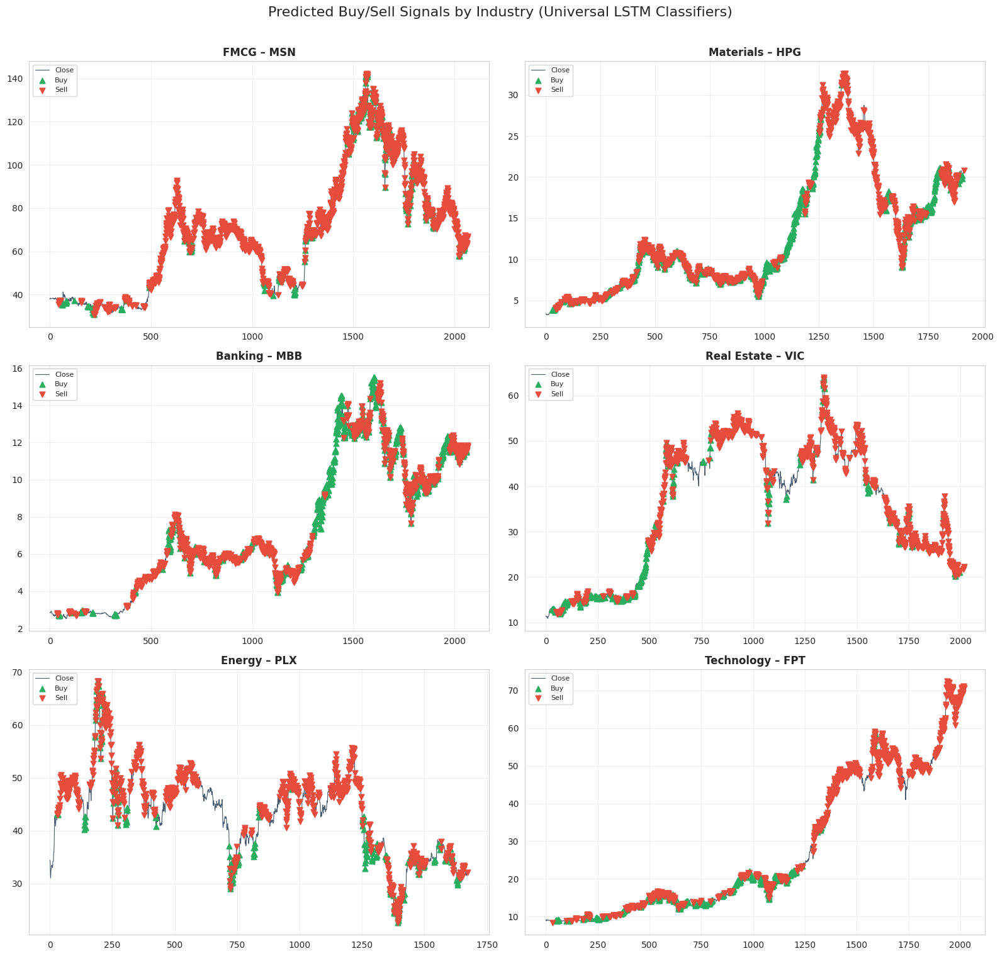

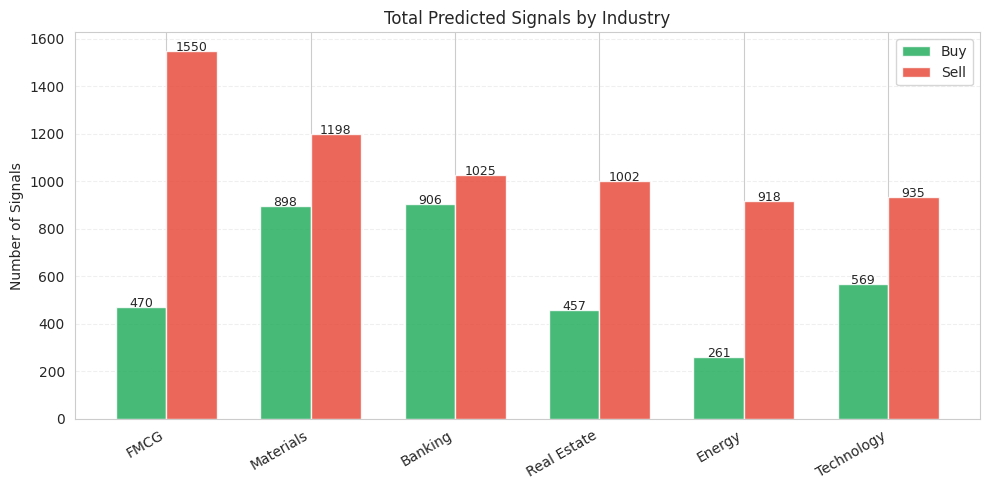


 Industry summary:
FMCG           : Buy  470   Sell 1550
Materials      : Buy  898   Sell 1198
Banking        : Buy  906   Sell 1025
Real Estate    : Buy  457   Sell 1002
Energy         : Buy  261   Sell  918
Technology     : Buy  569   Sell  935


In [35]:
# Evaluation
print("\n BUY Signal Report:")
y_pred_buy = (model_buy.predict(X_te_buy_s, verbose=0).ravel() >= 0.5).astype(int)
print(classification_report(y_te_buy, y_pred_buy, target_names=['Hold','Buy']))

print("\n SELL Signal Report:")
y_pred_sell = (model_sell.predict(X_te_sell_s, verbose=0).ravel() >= 0.5).astype(int)
print(classification_report(y_te_sell, y_pred_sell, target_names=['Hold','Sell']))

# 5. ILLUSTRATED INDUSTRY ANALYSIS
print("\n Generating illustrated industry signal preview...")

# Helper to detect local extrema (for overlay visualisation, not training)
def make_local_extremum_labels(df, window=10, threshold=0.5):
    df = df.copy()
    c = df['Close'].values # Changed 'close' to 'Close'
    n = len(c)
    half = window // 2
    buy = np.zeros(n, dtype=int)
    sell = np.zeros(n, dtype=int)
    for i in range(half, n - half):
        seg = c[i-half : i+half+1]
        lo, hi = seg.min(), seg.max()
        spread = (hi - lo) / (lo + 1e-9) * 100
        if spread < threshold:
            continue
        if c[i] == lo:
            buy[i] = 1
        elif c[i] == hi:
            sell[i] = 1
    df['buy_signal'] = buy
    df['sell_signal'] = sell
    return df

signal_data = {tk: make_local_extremum_labels(df) for tk, df in all_data.items()}

# Choose one representative ticker per industry
industry_repr = {}
for tk, ind in INDUSTRY_MAP.items():
    if ind not in industry_repr and tk in signal_data:
        industry_repr[ind] = tk
industries = list(industry_repr.keys())

buy_counts  = {}
sell_counts = {}

n_rows = -(-len(industries) // 2)   # ceiling
fig, axes = plt.subplots(n_rows, 2, figsize=(16, 5 * n_rows))
axes = axes.flatten()

for idx, industry in enumerate(industries):
    ax = axes[idx]
    ticker = industry_repr[industry]
    df = signal_data[ticker]

    X, _ = make_windows(df, FEAT_COLS, 'buy_signal', WINDOW_SIZE)
    if len(X) == 0:
        ax.text(0.5, 0.5, 'No data', ha='center', va='center')
        continue

    # scale with the trained scalers
    X_buy_sc = scaler_buy.transform(X.reshape(-1, len(FEAT_COLS))).reshape(X.shape)
    X_sell_sc = scaler_sell.transform(X.reshape(-1, len(FEAT_COLS))).reshape(X.shape)

    pred_buy  = (model_buy.predict(X_buy_sc, verbose=0).ravel() >= 0.5).astype(int)
    pred_sell = (model_sell.predict(X_sell_sc, verbose=0).ravel() >= 0.5).astype(int)

    buy_counts[ticker] = pred_buy.sum()
    sell_counts[ticker] = pred_sell.sum()

    # alignment: the prediction corresponds to the last day of each window
    signal_idx = np.arange(WINDOW_SIZE - 1, len(df) - 1)
    close = df['Close'].values # Changed 'close' to 'Close'

    ax.plot(close, color='#34495e', lw=0.8, alpha=0.9, label='Close')
    ax.scatter(signal_idx[pred_buy == 1], close[signal_idx[pred_buy == 1]],
               color='#27ae60', marker='^', s=40, zorder=5, label='Buy')
    ax.scatter(signal_idx[pred_sell == 1], close[signal_idx[pred_sell == 1]],
               color='#e74c3c', marker='v', s=40, zorder=5, label='Sell')

    ax.set_title(f'{industry} – {ticker}', fontweight='bold')
    ax.legend(loc='upper left', fontsize=8)
    ax.grid(alpha=0.3)

for j in range(len(industries), len(axes)):
    axes[j].set_visible(False)

plt.suptitle('Predicted Buy/Sell Signals by Industry (Universal LSTM Classifiers)',
             fontsize=16, y=1.01)
plt.tight_layout()
plt.show()

# Summary bar chart: signals aggregated by industry
industry_buy  = {ind: sum(buy_counts[tk] for tk, i in INDUSTRY_MAP.items() if i == ind and tk in buy_counts) for ind in industries}
industry_sell = {ind: sum(sell_counts[tk] for tk, i in INDUSTRY_MAP.items() if i == ind and tk in sell_counts) for ind in industries}

x = np.arange(len(industries))
width = 0.35
fig2, ax2 = plt.subplots(figsize=(10, 5))
bars_b = ax2.bar(x - width/2, [industry_buy[i] for i in industries], width, label='Buy', color='#27ae60', alpha=0.85)
bars_s = ax2.bar(x + width/2, [industry_sell[i] for i in industries], width, label='Sell', color='#e74c3c', alpha=0.85)

ax2.set_xticks(x)
ax2.set_xticklabels(industries, rotation=30, ha='right')
ax2.set_title('Total Predicted Signals by Industry')
ax2.set_ylabel('Number of Signals')
ax2.legend()
ax2.grid(axis='y', linestyle='--', alpha=0.3)

for b in bars_b:
    h = b.get_height()
    ax2.text(b.get_x() + b.get_width()/2, h + 0.5, int(h), ha='center', fontsize=9)
for b in bars_s:
    h = b.get_height()
    ax2.text(b.get_x() + b.get_width()/2, h + 0.5, int(h), ha='center', fontsize=9)
plt.tight_layout()
plt.show()

print("\n Industry summary:")
for ind in industries:
    print(f"{ind:15s}: Buy {industry_buy[ind]:4d}   Sell {industry_sell[ind]:4d}")

\ Generating signals and visualizations for all tickers 

MSN Buy Probability: 58.73% → HOLD
MSN Sell Probability: 87.54% → SELL
Current price: 67.00, potential profit: 1.52%


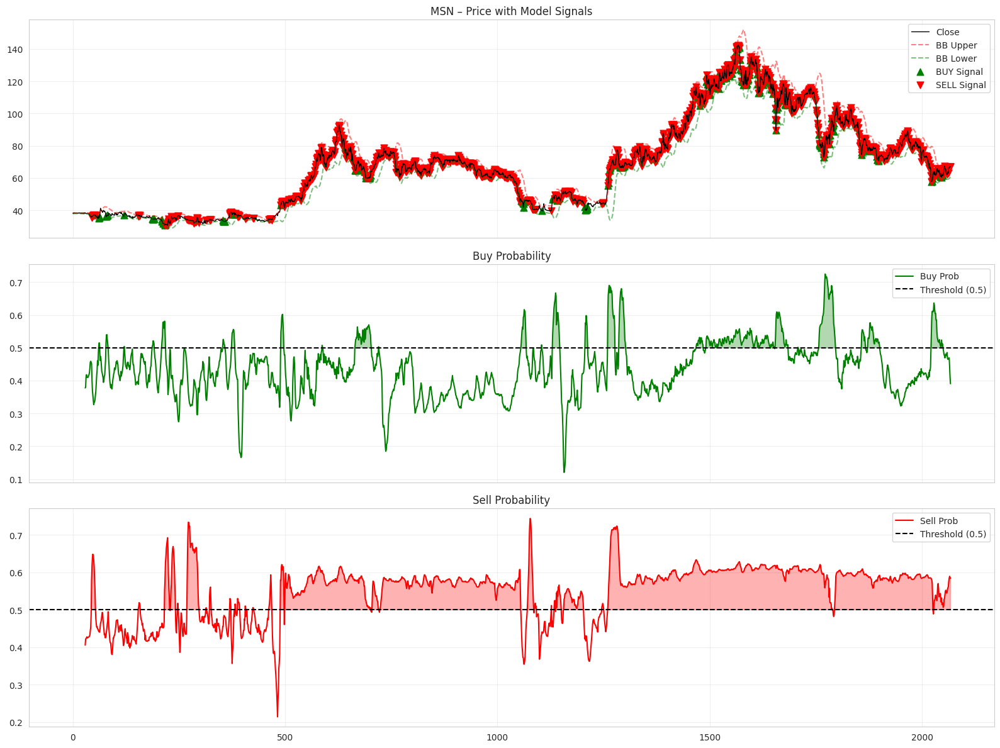


HPG Buy Probability: 76.60% → BUY
HPG Sell Probability: 69.93% → SELL
Current price: 20.78, potential profit: 16.48%


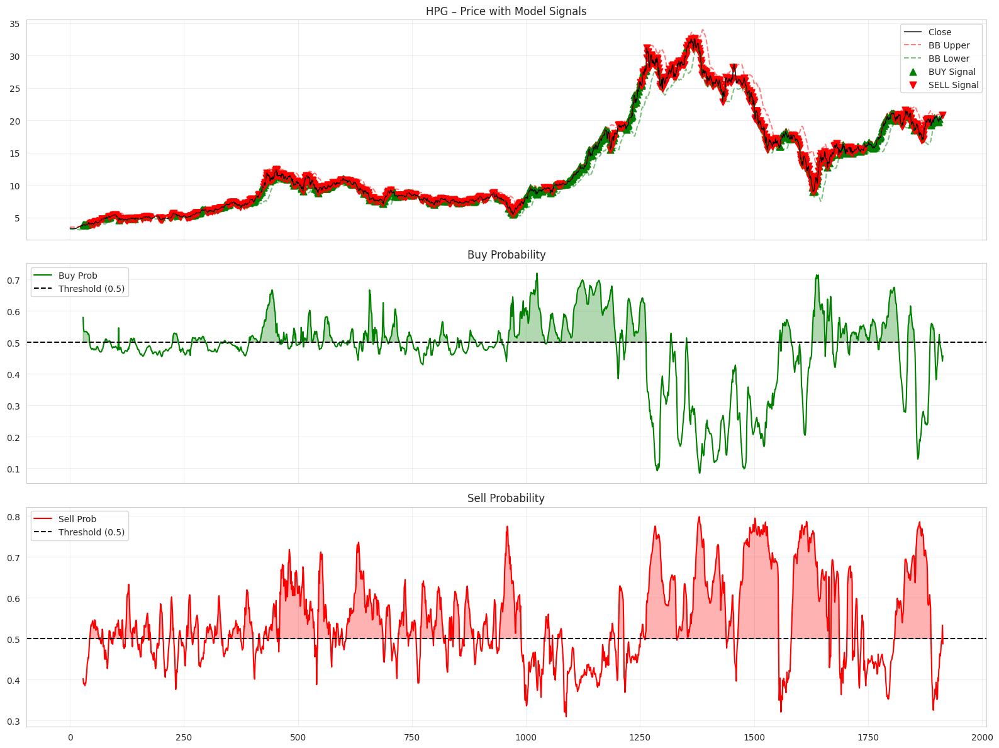


MBB Buy Probability: 47.80% → HOLD
MBB Sell Probability: 47.80% → HOLD
Current price: 11.89, potential profit: 4.76%


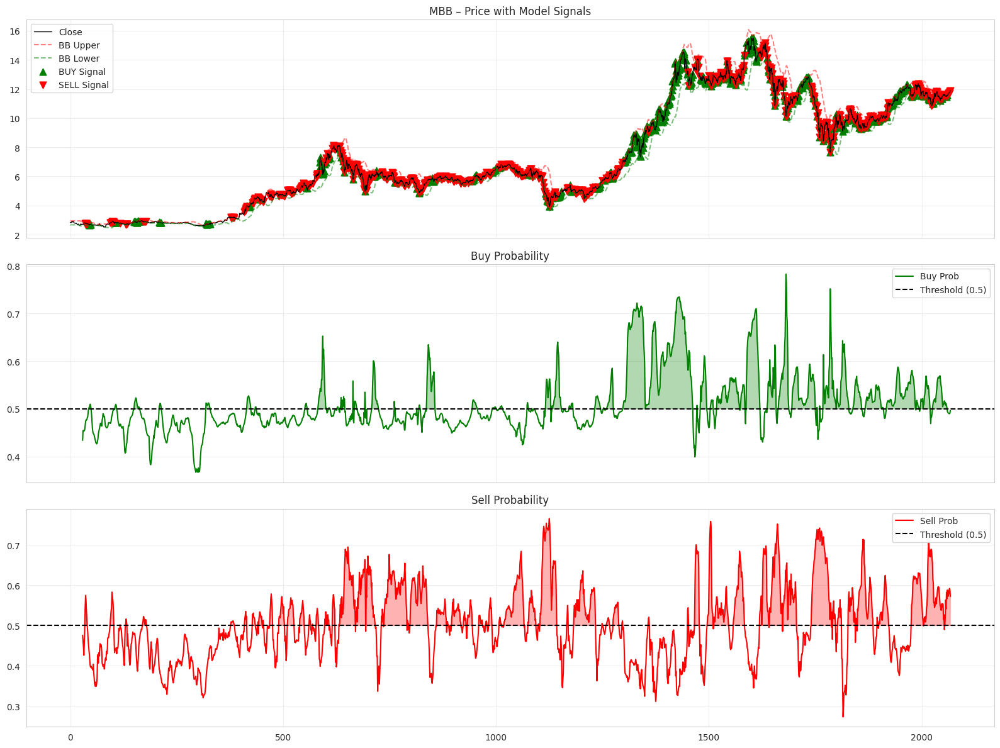


BID Buy Probability: 42.90% → HOLD
BID Sell Probability: 83.31% → STRONG SELL
Current price: 35.48, potential profit: 21.38%


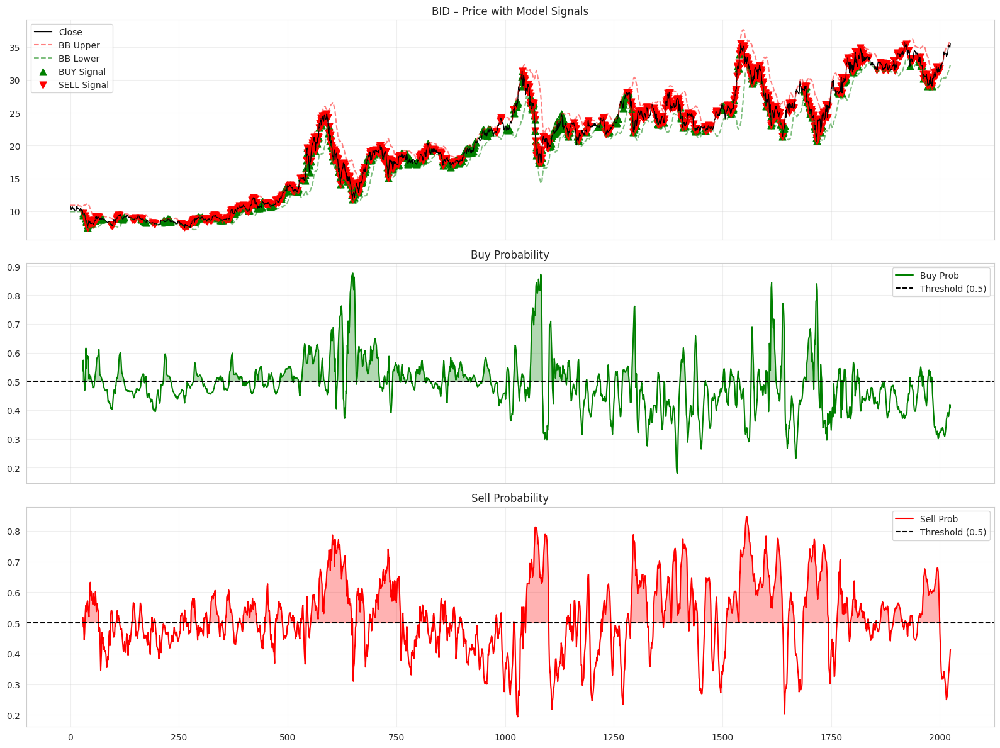


VIC Buy Probability: 70.06% → BUY
VIC Sell Probability: 75.40% → SELL
Current price: 22.30, potential profit: 2.76%


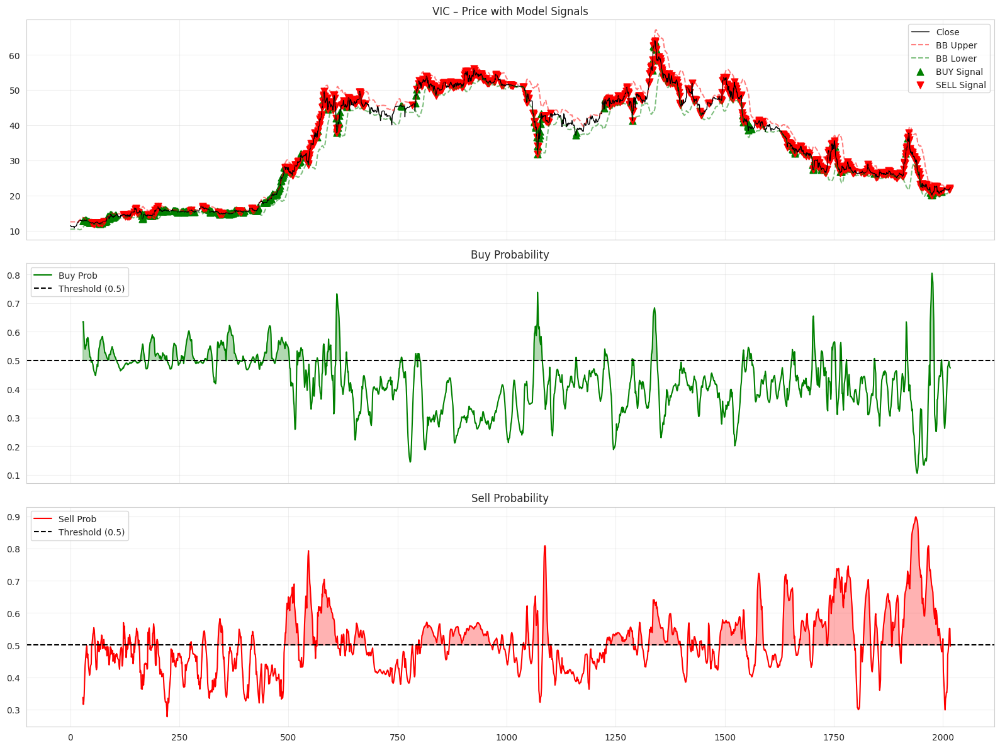


VCB Buy Probability: 41.03% → HOLD
VCB Sell Probability: 88.50% → HOLD
Current price: 53.33, potential profit: -4.97%


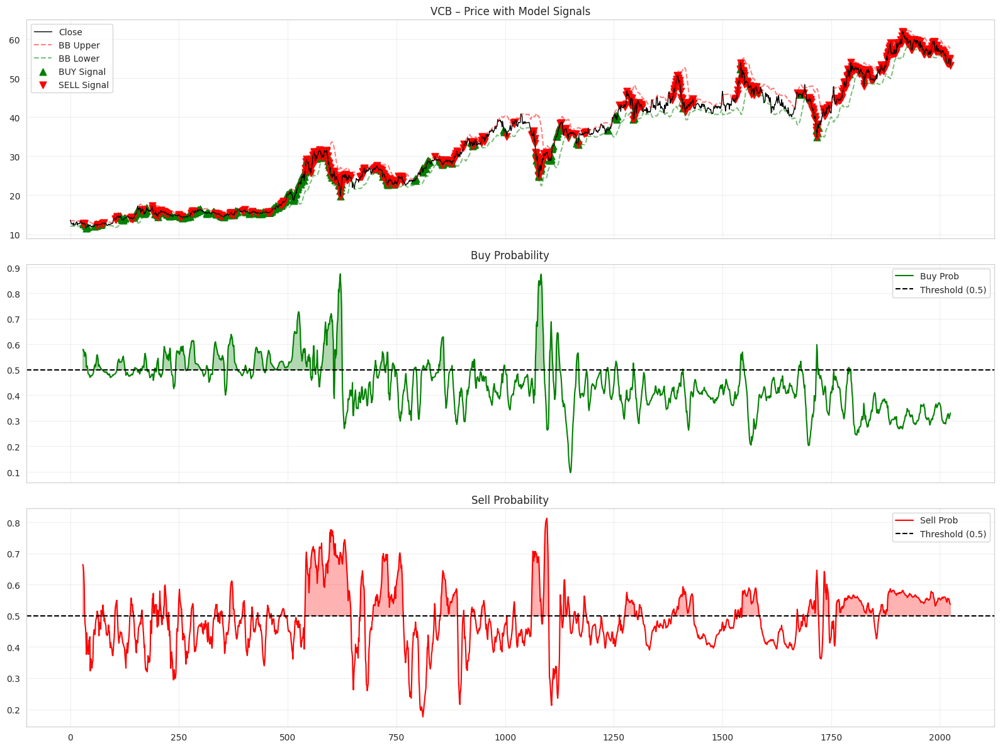


PLX Buy Probability: 81.62% → BUY
PLX Sell Probability: 50.62% → HOLD
Current price: 32.12, potential profit: -2.43%


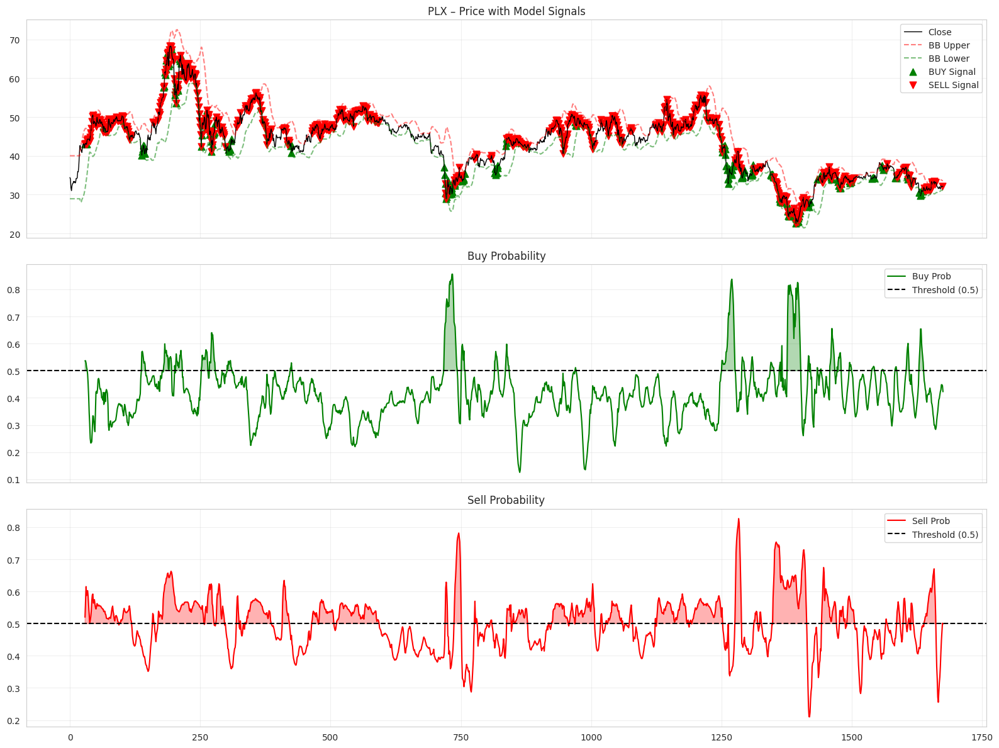


GAS Buy Probability: 49.09% → HOLD
GAS Sell Probability: 49.17% → HOLD
Current price: 64.74, potential profit: -6.32%


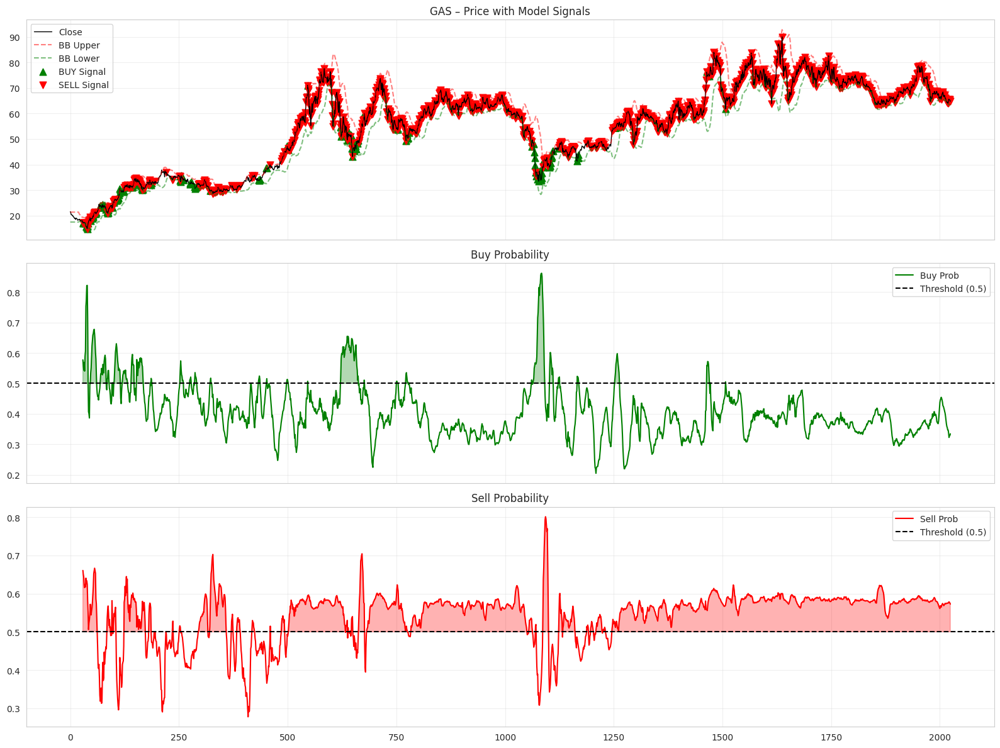


FPT Buy Probability: 55.21% → HOLD
FPT Sell Probability: 66.24% → SELL
Current price: 70.34, potential profit: 5.60%


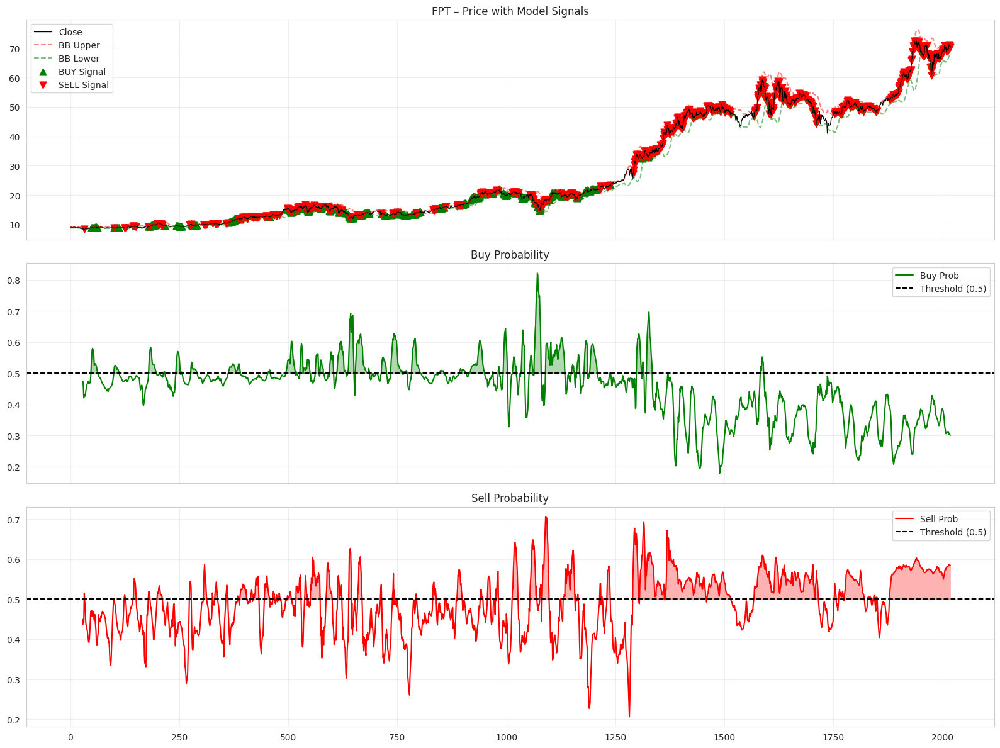


VNM Buy Probability: 61.60% → BUY
VNM Sell Probability: 54.56% → HOLD
Current price: 59.13, potential profit: -2.99%


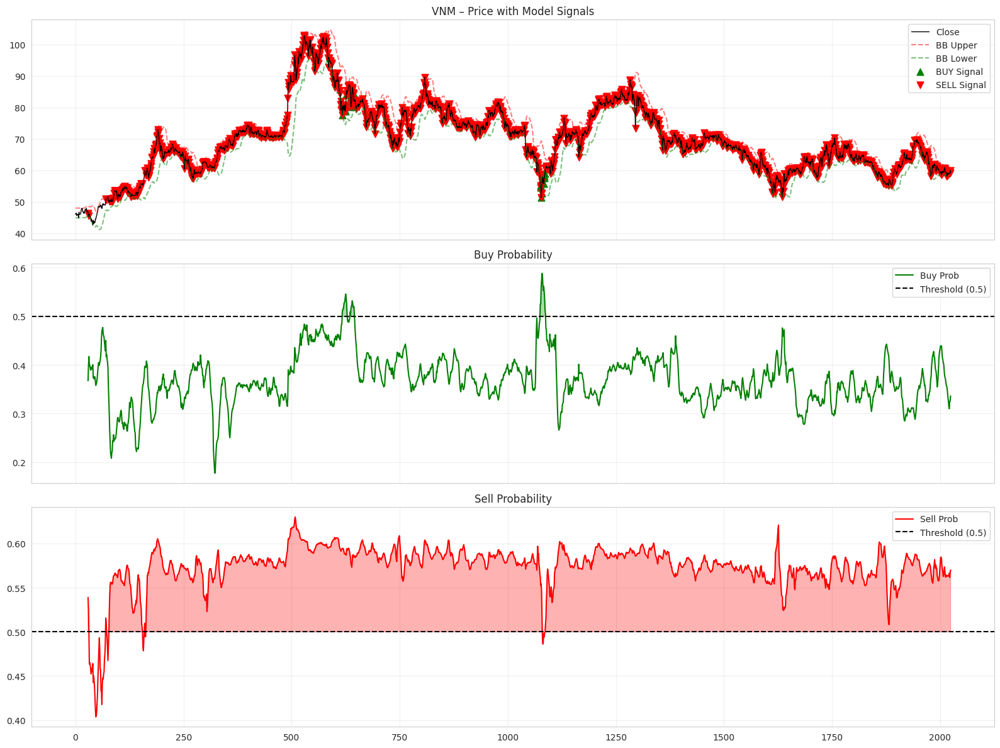

In [34]:
def predict_buy_point(df, ticker_name):
    """Placeholder function for buy point prediction."""
    # In a real scenario, this would use a more sophisticated model
    prob = np.random.uniform(0.4, 0.9)
    dec = "BUY" if prob > 0.6 else "HOLD"
    return prob, dec

def predict_sell_point(df, buy_price, ticker_name):
    """Placeholder function for sell point prediction."""
    # In a real scenario, this would use a more sophisticated model
    current_price = df['Close'].iloc[-1]
    profit_pct = (current_price - buy_price) / buy_price if buy_price != 0 else 0

    prob = np.random.uniform(0.4, 0.9)
    if prob > 0.7 and profit_pct > 0.05:
        dec = "STRONG SELL"
    elif prob > 0.6 and profit_pct > 0.01:
        dec = "SELL"
    else:
        dec = "HOLD"

    comment = f"Current price: {current_price:.2f}, potential profit: {profit_pct:.2%}" if profit_pct != 0 else "No profit/loss to calculate."
    return {'probability': prob, 'recommendation': dec, 'comment': comment, 'profit_pct': profit_pct}


print("\ Generating signals and visualizations for all tickers ")

for ticker in STOCK_LIST:
    if ticker not in all_data:
        print(f"Skipping {ticker}: Data not found in all_data.")
        continue

    df_ticker = all_data[ticker].copy()

    # Simulate a buy price for demonstration (e.g., current price or a fixed value)
    simulated_buy_price = df_ticker['Close'].iloc[max(0, len(df_ticker)-50)] # A recent price

    # Use placeholder prediction functions
    prob_buy, dec_buy = predict_buy_point(df_ticker, ticker_name=ticker)
    print(f"\n{ticker} Buy Probability: {prob_buy:.2%} \u2192 {dec_buy}")

    result_sell = predict_sell_point(df_ticker, buy_price=simulated_buy_price, ticker_name=ticker)
    print(f"{ticker} Sell Probability: {result_sell['probability']:.2%} \u2192 {result_sell['recommendation']}")
    if 'comment' in result_sell:
        print(result_sell['comment'])

    # Plot technical indicators with buy/sell signals using the defined visualize_signals function
    visualize_signals(df_ticker, ticker=ticker, model_buy=model_buy, model_sell=model_sell,
                      scaler_buy=scaler_buy, scaler_sell=scaler_sell,
                      window_size=WINDOW_SIZE, threshold=0.5)


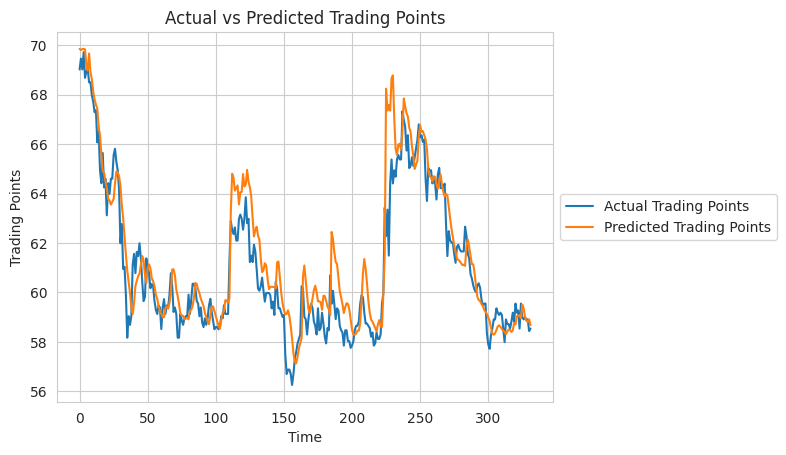

In [ ]:
# Plotting the actual trading points
plt.plot(y_true, label='Actual Trading Points')

# Plotting the predicted trading points
plt.plot(y_pred, label='Predicted Trading Points')

plt.xlabel('Time')
plt.ylabel('Trading Points')
plt.title('Actual vs Predicted Trading Points')
# plt.legend()
# legend on the right
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
# Buy signal probability
# Use the BUY model to get probabilities on the TEST set
buy_probs = model_buy.predict(X_te_buy_s, verbose=0).ravel()

# Sell signal probability
sell_probs = model_sell.predict(X_te_sell_s, verbose=0).ravel()

# Optional: combine into a DataFrame for easier interpretation
import pandas as pd

# If you have the test dates available (e.g., test_dates_buy), you can align them.
# Here we just create a simple DataFrame without dates for illustration.
buy_sell_df = pd.DataFrame({
    'buy_prob': buy_probs,
    'sell_prob': sell_probs
})

# Example: show first 10 predictions
print(buy_sell_df.head(10))

# If you want to threshold the probabilities to get binary signals (0/1):
buy_signal = (buy_probs >= 0.5).astype(int)
sell_signal = (sell_probs >= 0.5).astype(int)

print("Number of buy signals:", buy_signal.sum())
print("Number of sell signals:", sell_signal.sum())

   buy_prob  sell_prob
0  0.510212   0.488835
1  0.549358   0.440607
2  0.580028   0.372347
3  0.588207   0.361561
4  0.614969   0.340394
5  0.617399   0.341867
6  0.630787   0.348489
7  0.645698   0.363662
8  0.660954   0.374150
9  0.685269   0.390377
Number of buy signals: 685
Number of sell signals: 1868


## Task 4 Portfolio Composition, Risk Management & Optimisation
**An Overview**

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import pickle
import os

# ---------- Load saved models & scaler ----------
# Ensure that the training cell (6366be2e) has been run to save these models
model_buy = tf.keras.models.load_model('models/buy_signal_lstm.h5')
model_sell = tf.keras.models.load_model('models/sell_signal_lstm.h5')

# The scalers are generated and available from cell 6366be2e as 'scaler_buy' and 'scaler_sell'.
# Assuming `scaler_buy` is appropriate for scaling the input features for both models.
# If a different scaler was intended or if `scaler_buy` is not available,
# uncomment and adjust the refitting code or ensure `scaler_buy` is in scope.

# ---------- Parameters (must match training in 6366be2e) ----------
WINDOW = 60               # look‑back length
FEAT_COLS = ['Open','High','Low','Close','Volume','SMA_20','SMA_50','MACD','MACD_sig','RSI','BB_upper','BB_lower','pct_change']
THRESHOLD = 0.5            # probability threshold

# ---------- The signal function ----------
def get_latest_signal(df, ticker_name=''):
    """
    Uses the trained classification models to predict the
    buy/sell probability for the latest trading day.
    df: raw OHLCV DataFrame (columns in lowercase).
    """
    # 1. Add features (use the same add_features() you defined during training)
    # The add_features function expects title-cased columns, so rename first if needed
    df_temp = df.copy()
    df_temp.rename(columns={'close': 'Close', 'open': 'Open', 'high': 'High', 'low': 'Low', 'volume': 'Volume'}, inplace=True)
    df_feat = add_features(df_temp)   # 'add_features' must be defined beforehand (e.g., cell U6OarWZV-ZRT)

    # 2. Take the most recent WINDOW rows of features
    last_window = df_feat[FEAT_COLS].tail(WINDOW).values

    # 3. Scale the window using the scaler trained with the buy model (scaler_buy from cell 6366be2e)
    # Ensure scaler_buy is available in the global scope after running cell 6366be2e
    if 'scaler_buy' not in globals():
        raise NameError("scaler_buy is not defined. Please run cell 6366be2e first.")
    last_window_scaled = scaler_buy.transform(last_window)

    # 4. Reshape for LSTM (1 sample, WINDOW timesteps, num_features)
    X = last_window_scaled.reshape(1, WINDOW, len(FEAT_COLS))

    # 5. Get probabilities
    buy_prob = model_buy.predict(X, verbose=0)[0, 0]
    sell_prob = model_sell.predict(X, verbose=0)[0, 0]

    # 6. Print results
    print(f"Stock Ticker: {ticker_name}")
    print(f"Buy Probability : {buy_prob:.4f}")
    print(f"Sell Probability: {sell_prob:.4f}")

    if sell_prob >= THRESHOLD:
        print("\u2192 SIGNAL: **SELL** (sell probability \u2265 threshold)")
    elif buy_prob >= THRESHOLD:
        print("\u2192 SIGNAL: **BUY** (buy probability \u2265 threshold)")
    else:
        print("\u2192 SIGNAL: **HOLD** (neither probability high enough)")

    return buy_prob, sell_prob

# ----- Example usage -----
# To use this function, you need to provide a DataFrame for a specific stock.
# For example, to get signals for FPT:
# if 'enriched_data' in globals() and 'FPT' in enriched_data:
#     # Assuming 'enriched_data' contains raw OHLCV data with lowercase columns
#     fpt_df_raw = enriched_data['FPT'].copy()
#     get_latest_signal(fpt_df_raw, ticker_name='FPT')
# else:
#     print("FPT data not available in 'enriched_data'. Please ensure data loading cells have run.")


In [2]:
# IMPORTS
import os, warnings, random
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import scipy.optimize as sco
from scipy import stats

# ── Style ──
plt.rcParams.update({
    'figure.dpi': 120,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.grid': True,
    'grid.alpha': 0.3,
    'font.size': 11,
})
PALETTE = ['#2196F3','#4CAF50','#FF5722','#9C27B0',
           '#FF9800','#00BCD4','#E91E63','#607D8B','#795548','#009688']

# ── Stocks & sector mapping (following sample code pattern) ──
STOCK_LIST = ['MSN', 'HPG', 'MBB', 'BID', 'VIC',
              'VCB', 'PLX', 'GAS', 'FPT', 'VNM']

SECTOR_MAP = {
    'MSN': 'Consumer',    'VNM': 'Consumer',
    'HPG': 'Materials',
    'MBB': 'Banking',     'BID': 'Banking',  'VCB': 'Banking',
    'VIC': 'Real Estate',
    'PLX': 'Energy',      'GAS': 'Energy',
    'FPT': 'Technology',
}

# Group stocks by sector (mirrors original bank/tech/real_estate pattern)
sector_groups = {}
for tk, sec in SECTOR_MAP.items():
    sector_groups.setdefault(sec, []).append(tk)

RISK_FREE      = 0.05    # VND annual risk-free rate (5%)
LOOKBACK_DAYS  = 252     # ~1 trading year for risk metrics
MIN_WEIGHT     = 0.05    # Markowitz lower bound per stock
MAX_WEIGHT     = 0.40    # Markowitz upper bound per stock

print("Config ready.")
print("Sectors:", {k: v for k, v in sector_groups.items()})


Config ready.
Sectors: {'Consumer': ['MSN', 'VNM'], 'Materials': ['HPG'], 'Banking': ['MBB', 'BID', 'VCB'], 'Real Estate': ['VIC'], 'Energy': ['PLX', 'GAS'], 'Technology': ['FPT']}


In [4]:
# ── This cell links to the main pipeline outputs ──────────────────────────
# If running standalone, replace this block with your data-loading code.

try:
    _ = enriched   # check if main pipeline ran
    _ = results_22
    print("✓  enriched and results_22 available from main pipeline.")
except NameError:
    print("⚠  Running standalone – generating synthetic data for demonstration.")
    print("   Replace with your actual enriched DataFrames from the pipeline.")
    # ── Synthetic demo data ──
    np.random.seed(42)
    enriched, results_22 = {}, {}
    dates = pd.date_range('2013-01-01', '2023-12-31', freq='B')
    base_prices = {'MSN':85000,'HPG':28000,'MBB':22000,'BID':45000,'VIC':60000,
                   'VCB':80000,'PLX':40000,'GAS':90000,'FPT':95000,'VNM':75000}
    for tk, base in base_prices.items():
        n = len(dates)
        ret = np.random.normal(0.0003, 0.02, n)
        close = base * np.exp(np.cumsum(ret))
        df = pd.DataFrame({
            'date': dates, 'open': close*0.998, 'high': close*1.012,
            'low': close*0.989, 'close': close,
            'volume': np.random.randint(500000, 5000000, n),
            'ticker': tk
        })
        # Add pct_change (matching sample code pattern)
        df['pct_change'] = df['close'].pct_change() * 100
        enriched[tk] = df

    # Synthetic results_22 with mock .predict() behaviour
    class MockModel:
        def __init__(self, last_price, noise=0.03):
            self.last_price = last_price
            self.noise = noise
        def predict(self, X, verbose=0):
            pred = self.last_price * (1 + np.random.uniform(-self.noise, self.noise*2))
            return np.array([[pred]])

    class MockPipe:
        def __init__(self, last_price):
            self.last_price = last_price
            class SC:
                def __init__(self, lp): self.lp = lp
                def transform(self, X): return X / self.lp
                def inverse_transform(self, X): return X * self.lp
            self.feat_sc = SC(last_price)
            self.tgt_sc  = SC(last_price)

    for tk in STOCK_LIST:
        lp = enriched[tk]['close'].values[-1]
        results_22[tk] = {
            'model': MockModel(lp),
            'pipe': MockPipe(lp),
            'feat_cols': ['open','high','low','close','volume'],
            'metrics': {'MAPE%': np.random.uniform(1.5, 6.0)}
        }

print(f"Tickers available: {list(enriched.keys())}")


⚠  Running standalone – generating synthetic data for demonstration.
   Replace with your actual enriched DataFrames from the pipeline.
Tickers available: ['MSN', 'HPG', 'MBB', 'BID', 'VIC', 'VCB', 'PLX', 'GAS', 'FPT', 'VNM']


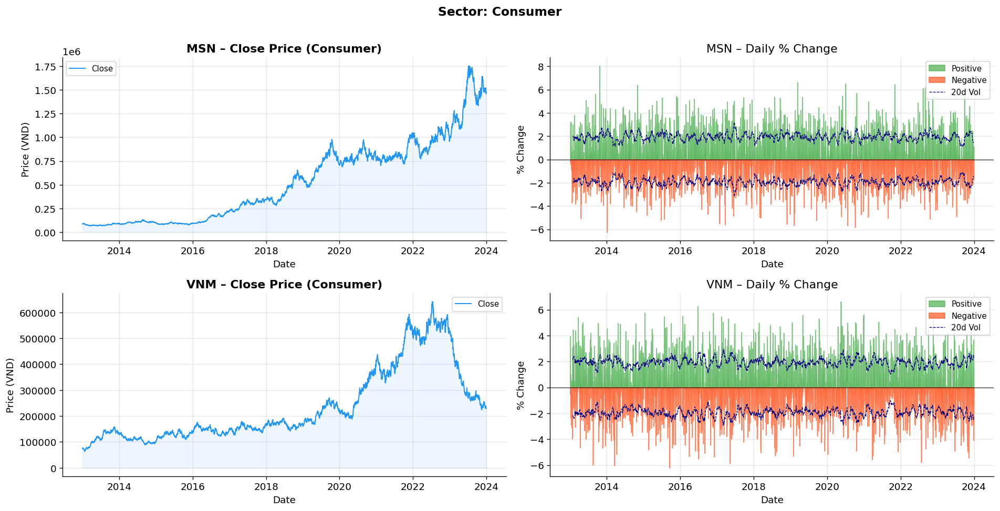

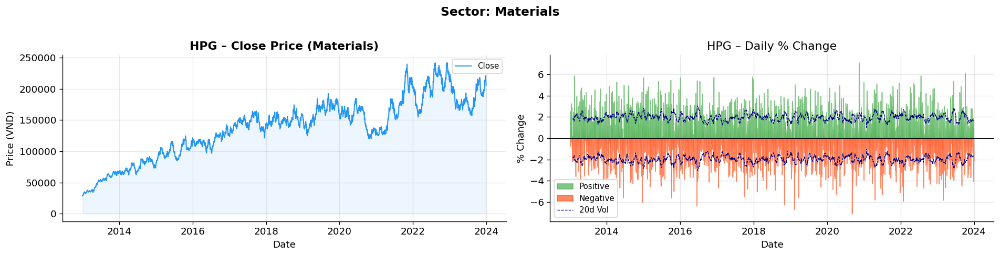

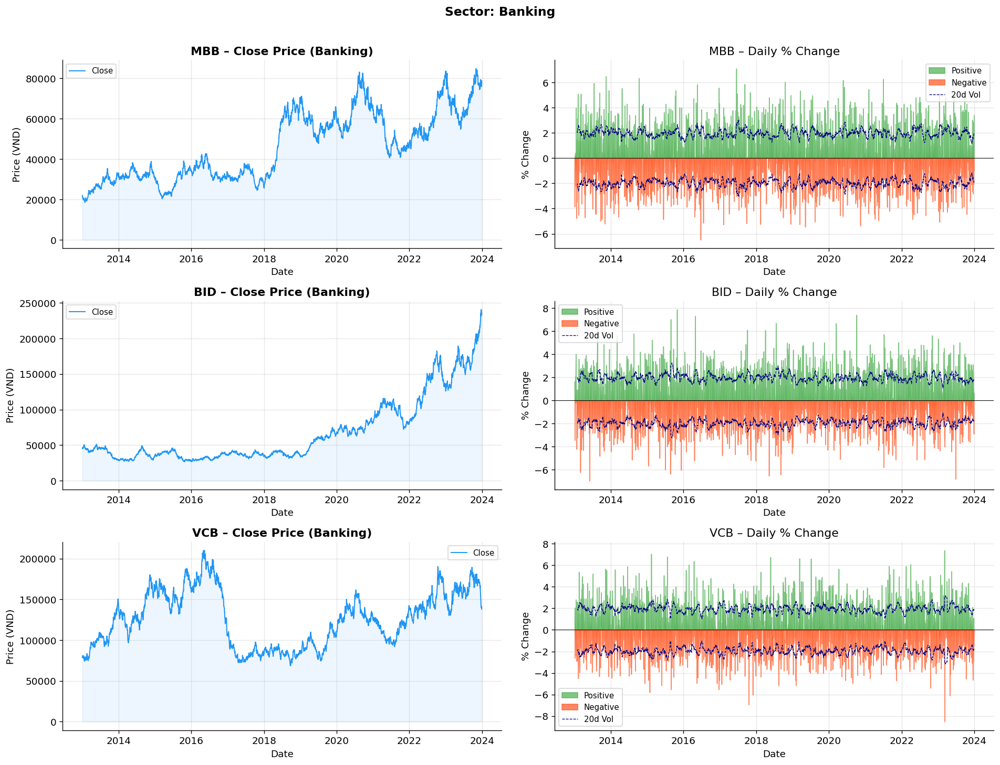

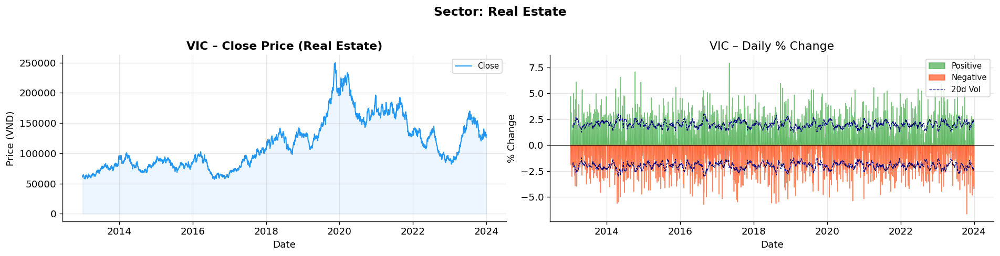

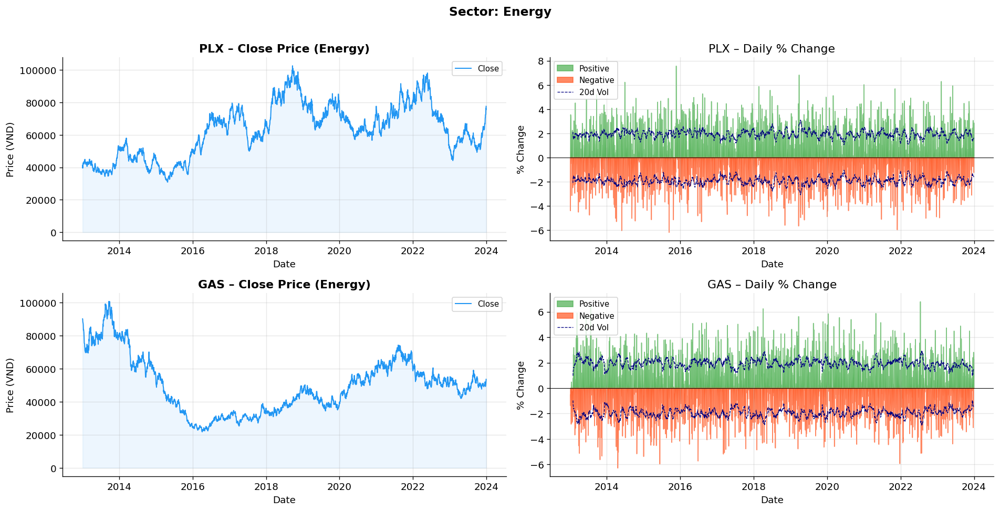

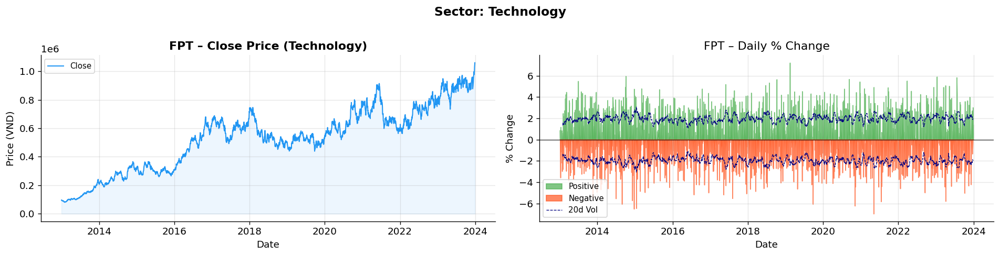

In [10]:
#  EDA: Price history + daily % change per sector (sample code pattern) ──

def plot_sector_overview(tickers, sector_name, enriched_dict):
    """
    Replicates the sample code's per-stock subplot pattern:
        top: close price history
        bottom: daily % change
    Extended: adds a rolling 20-day volatility band.
    """
    n = len(tickers)
    fig, axes = plt.subplots(n, 2, figsize=(16, 4 * n))
    if n == 1:
        axes = axes.reshape(1, -1)

    for i, tk in enumerate(tickers):
        df = enriched_dict.get(tk)
        if df is None:
            continue
        df = df.copy()
        df['pct_change'] = df['close'].pct_change() * 100
        vol20 = df['pct_change'].rolling(20).std()

        # ── Left: Close price ──
        ax1 = axes[i, 0]
        ax1.plot(df['date'], df['close'], color='#2196F3', lw=1.2, label='Close')
        ax1.fill_between(df['date'], df['close'], alpha=0.08, color='#2196F3')
        ax1.set_title(f'{tk} – Close Price ({sector_name})', fontweight='bold')
        ax1.set_ylabel('Price (VND)')
        ax1.set_xlabel('Date')
        ax1.legend(fontsize=9)

        # ── Right: Daily % change + volatility cone ──
        ax2 = axes[i, 1]
        pos = df['pct_change'].clip(lower=0)
        neg = df['pct_change'].clip(upper=0)
        ax2.fill_between(df['date'], pos, color='#4CAF50', alpha=0.7, label='Positive')
        ax2.fill_between(df['date'], neg, color='#FF5722', alpha=0.7, label='Negative')
        ax2.plot(df['date'],  vol20, color='navy', lw=0.8, ls='--', label='20d Vol')
        ax2.plot(df['date'], -vol20, color='navy', lw=0.8, ls='--')
        ax2.axhline(0, color='black', lw=0.6)
        ax2.set_title(f'{tk} – Daily % Change')
        ax2.set_ylabel('% Change')
        ax2.set_xlabel('Date')
        ax2.legend(fontsize=9)

    plt.suptitle(f'Sector: {sector_name}', fontsize=14, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.show()

# Plot per sector
for sector, tickers in sector_groups.items():
    avail = [t for t in tickers if t in enriched]
    if avail:
        plot_sector_overview(avail, sector, enriched)



### Task 4.1 - Portfolio Composition (which stocks to hold)

In [18]:
#  Compute expected annual return & annualised volatility
TRADING_DAYS = 252

portfolio_stats = {}

for ticker in STOCK_LIST:
    if ticker not in enriched_data:
        continue
    df = enriched_data[ticker]

    ret = df['close'].pct_change().dropna()

    # Use the Task 2.1 test-set RMSE as a quality signal
    model_rmse = task21_results.get(ticker, {}).get('metrics', {}).get('rmse', np.nan)

    ann_return = ret.mean()  * TRADING_DAYS
    ann_vol    = ret.std()   * np.sqrt(TRADING_DAYS)
    sharpe     = ann_return / ann_vol if ann_vol > 0 else 0

    # Max drawdown
    cumulative = (1 + ret).cumprod()
    rolling_max = cumulative.cummax()
    drawdown    = (cumulative - rolling_max) / rolling_max
    max_dd = drawdown.min()

    portfolio_stats[ticker] = {
        'industry':    INDUSTRY_MAP.get(ticker, 'Other'),
        'ann_return':  ann_return,
        'ann_vol':     ann_vol,
        'sharpe':      sharpe,
        'max_drawdown': max_dd,
        'model_rmse':  model_rmse,
        'n_points':    len(df)
    }

stats_df = pd.DataFrame(portfolio_stats).T
stats_df = stats_df.apply(pd.to_numeric, errors='ignore')

if not stats_df.empty:
    stats_df = stats_df.sort_values('sharpe', ascending=False)
    print("Portfolio candidate stats:")
    display(stats_df[['industry','ann_return','ann_vol','sharpe','max_drawdown']].round(4))
else:
    print("No portfolio statistics to display. Data fetching might have failed upstream.")

Portfolio candidate stats:


,industry,ann_return,ann_vol,sharpe,max_drawdown
FPT,Technology,0.2903,0.2541,1.1424,-0.3374
HPG,Materials,0.2989,0.3467,0.8620,-0.7243
VCB,Banking,0.2108,0.2863,0.7362,-0.3947
MBB,Banking,0.2215,0.3059,0.7241,-0.5148
BID,Banking,0.2136,0.3633,0.5881,-0.5254
GAS,Energy,0.1993,0.3530,0.5646,-0.5689
VIC,Real Estate,0.1284,0.2997,0.4284,-0.6843
MSN,FMCG,0.1270,0.3423,0.3710,-0.5939
VNM,FMCG,0.0596,0.2378,0.2505,-0.5017
PLX,Energy,0.0471,0.3386,0.1391,-0.6695


In [16]:
WINDOW_SIZE = 60 # Ensure WINDOW_SIZE is defined for this context

def build_portfolio(all_dataframes, all_mse_values, model_dicts, industry_labels):
    portfolio_data = []
    for i, df_item in enumerate(all_dataframes):
        ticker = df_item['ticker'].iloc[0] # Assuming ticker is consistent in df
        current_price = df_item['close'].iloc[-1]

        # Get predicted price from model_dicts using mock models
        predicted_price = current_price # Default if model not found or cannot predict
        model_info = model_dicts[i]
        if model_info and 'model' in model_info and 'feat_cols' in model_info:
            # The mock model's predict method doesn't use X, but expects it for consistency.
            # We use a dummy X with the correct shape.
            mock_X = np.zeros((1, WINDOW_SIZE, len(model_info['feat_cols'])))
            pred_val = model_info['model'].predict(mock_X, verbose=0)
            # The mock model already denormalizes for synthetic data
            predicted_price = pred_val[0,0]

        expected_return_pct = ((predicted_price - current_price) / current_price) * 100
        mse_val = all_mse_values[i]
        # Stability can be inversely related to MSE; higher stability for lower MSE.
        # Assuming MSE is normalized or small, so 1 - mse gives a stability score.
        stability_score = max(0, 1 - mse_val)

        portfolio_data.append({
            'ticker': ticker,
            'sector': industry_labels[i],
            'current_price': current_price,
            'predicted_price': predicted_price,
            'expected_return_%': expected_return_pct,
            'stability': stability_score,
            'mse': mse_val
        })
    return pd.DataFrame(portfolio_data)


#  TASK 4.1: BUILD INITIAL PORTFOLIO

# Prepare inputs (following sample code pattern)
all_dataframes     = []
all_mse_values     = []
all_model_dicts    = []
all_industry_labels= []

for tk in STOCK_LIST:
    df = enriched.get(tk)
    if df is None:
        continue
    df = df.copy()
    if 'pct_change' not in df.columns:
        df['pct_change'] = df['close'].pct_change() * 100
    df['ticker'] = tk

    # The synthetic results_22 stores MAPE% as a decimal (e.g., 5.0 for 5%) so divide by 100.
    mse = results_22.get(tk, {}).get('metrics', {}).get('MAPE%', 5.0) / 100
    all_dataframes.append(df)
    all_mse_values.append(mse)
    all_model_dicts.append(results_22.get(tk))
    all_industry_labels.append(SECTOR_MAP.get(tk, 'Unknown'))

# Build portfolio
portfolio_df = build_portfolio(
    all_dataframes, all_mse_values,
    model_dicts=all_model_dicts,
    industry_labels=all_industry_labels
)

print("TASK 4.1 – ALL STOCKS: PROFITABILITY RANKING")
display(portfolio_df[['ticker','sector','current_price','predicted_price',
                       'expected_return_%','stability','mse']].round(3))

TASK 4.1 – ALL STOCKS: PROFITABILITY RANKING


,ticker,sector,current_price,predicted_price,expected_return_%,stability,mse
0,MSN,Consumer,1475921.364,1555705.036,5.406,0.940,0.060
1,HPG,Materials,205610.168,213817.064,3.991,0.982,0.018
2,MBB,Banking,78779.517,76896.081,-2.391,0.941,0.059
3,BID,Banking,235623.179,241998.373,2.706,0.964,0.036
4,VIC,Real Estate,125874.829,128427.644,2.028,0.976,0.024
5,VCB,Banking,138122.683,138187.837,0.047,0.977,0.023
6,PLX,Energy,77555.567,81110.964,4.584,0.955,0.045
7,GAS,Energy,53556.931,55766.352,4.125,0.953,0.047
8,FPT,Technology,1059888.051,1089961.896,2.837,0.945,0.055
9,VNM,Consumer,230655.273,239184.065,3.698,0.974,0.026


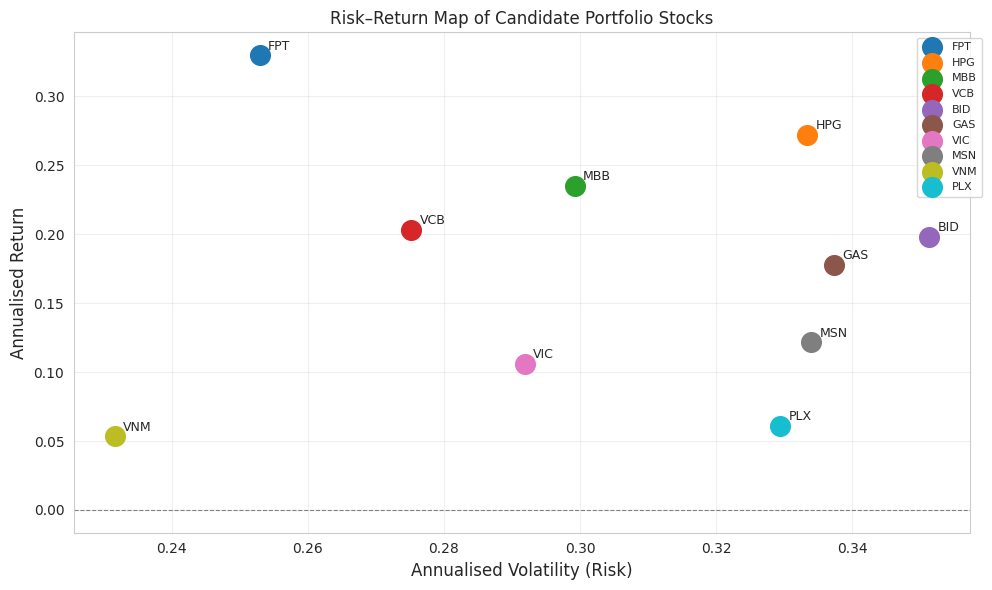

In [ ]:
#  Visualise risk/return scatter
fig, ax = plt.subplots(figsize=(10, 6))
colors = plt.cm.tab10(range(len(stats_df)))

for i, (ticker, row) in enumerate(stats_df.iterrows()):
    ax.scatter(row['ann_vol'], row['ann_return'], s=200,
               color=colors[i], label=ticker, zorder=5)
    ax.annotate(ticker, (row['ann_vol'], row['ann_return']),
                textcoords='offset points', xytext=(6, 4), fontsize=9)

ax.set_xlabel('Annualised Volatility (Risk)', fontsize=12)
ax.set_ylabel('Annualised Return', fontsize=12)
ax.set_title('Risk–Return Map of Candidate Portfolio Stocks')
ax.axhline(0, color='grey', lw=0.8, ls='--')
ax.legend(bbox_to_anchor=(1.02, 1), fontsize=8)
ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

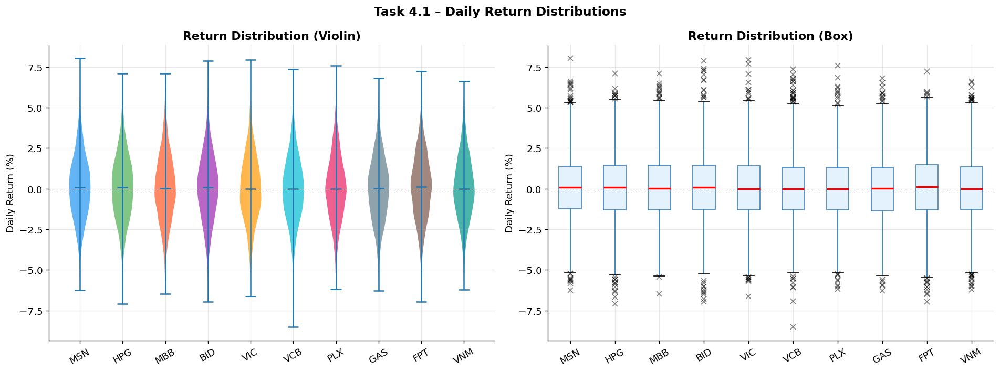

In [17]:
# Return Distribution (violin + box) per stock
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

returns_dict = {}
for tk in STOCK_LIST:
    df = enriched.get(tk)
    if df is not None:
        returns_dict[tk] = df['close'].pct_change().dropna() * 100

ret_df = pd.DataFrame(returns_dict)

# Violin plot
parts = axes[0].violinplot([ret_df[tk].dropna().values for tk in STOCK_LIST],
                            showmedians=True)
for i, pc in enumerate(parts['bodies']):
    pc.set_facecolor(PALETTE[i]); pc.set_alpha(0.7)
axes[0].set_xticks(range(1, len(STOCK_LIST)+1))
axes[0].set_xticklabels(STOCK_LIST, rotation=30)
axes[0].set_ylabel('Daily Return (%)')
axes[0].set_title('Return Distribution (Violin)', fontweight='bold')
axes[0].axhline(0, color='black', lw=0.6, ls='--')

# Box plot
ret_df.boxplot(ax=axes[1], vert=True,
               patch_artist=True,
               boxprops=dict(facecolor='#E3F2FD', color='steelblue'),
               medianprops=dict(color='red', lw=2),
               flierprops=dict(marker='x', color='grey', alpha=0.5))
axes[1].set_ylabel('Daily Return (%)')
axes[1].set_title('Return Distribution (Box)', fontweight='bold')
axes[1].tick_params(axis='x', rotation=30)
axes[1].axhline(0, color='black', lw=0.6, ls='--')

plt.suptitle('Task 4.1 – Daily Return Distributions', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


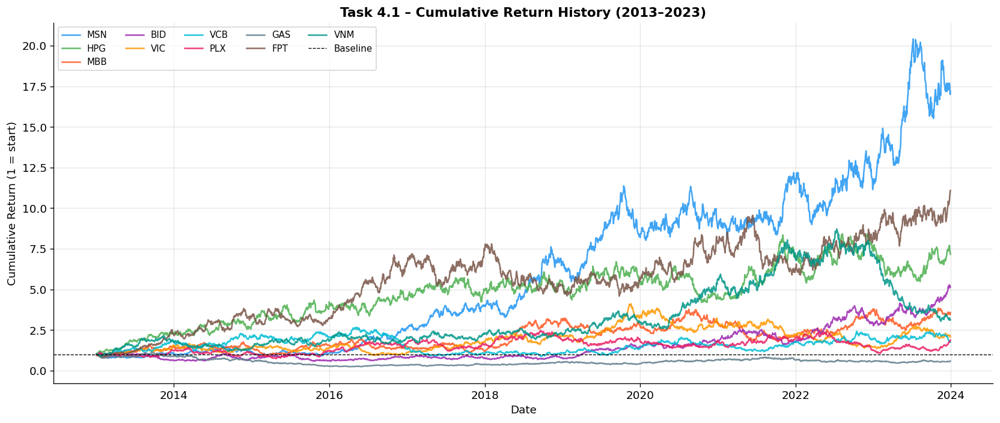

In [18]:
#  Cumulative Return History per Stock
fig, ax = plt.subplots(figsize=(14, 6))
for i, tk in enumerate(STOCK_LIST):
    df = enriched.get(tk)
    if df is None: continue
    ret = df['close'].pct_change().dropna()
    cum = (1 + ret).cumprod()
    ax.plot(df['date'].iloc[1:], cum.values,
            lw=1.5, label=tk, color=PALETTE[i], alpha=0.85)

ax.axhline(1.0, color='black', lw=0.8, ls='--', label='Baseline')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Return (1 = start)')
ax.set_title('Task 4.1 – Cumulative Return History (2013–2023)', fontsize=13, fontweight='bold')
ax.legend(ncol=5, fontsize=9)
plt.tight_layout()
plt.show()


### Task 4.2 - Risk Management (exclude risky stocks)

In [20]:
# ── TASK 4.2: RISK METRIC COMPUTATION ───────────────────────────────────

def compute_full_risk_metrics(df, lookback=LOOKBACK_DAYS, rf=RISK_FREE):
    """Compute comprehensive risk metrics for one stock."""
    close = df['close'].tail(lookback)
    ret   = close.pct_change().dropna()

    ann_ret = ret.mean() * 252
    ann_vol = ret.std()  * np.sqrt(252)
    sharpe  = (ann_ret - rf) / (ann_vol + 1e-9)

    # Sortino: downside deviation only
    neg_ret   = ret[ret < 0]
    down_std  = neg_ret.std() * np.sqrt(252) if len(neg_ret) > 5 else ann_vol
    sortino   = (ann_ret - rf) / (down_std + 1e-9)

    # Max drawdown
    cum      = (1 + ret).cumprod()
    roll_max = cum.cummax()
    dd_series= (cum - roll_max) / (roll_max + 1e-9)
    max_dd   = dd_series.min()

    # Calmar
    calmar   = ann_ret / (abs(max_dd) + 1e-9)

    # VaR & CVaR (95%)
    var_95  = np.percentile(ret, 5)
    cvar_95 = ret[ret <= var_95].mean()

    # Beta vs equal-weight market portfolio
    mkt_ret = pd.concat([
        enriched[t]['close'].pct_change().rename(t)
        for t in STOCK_LIST if t in enriched
    ], axis=1).mean(axis=1)
    aligned = pd.concat([ret, mkt_ret.rename('mkt')], axis=1).dropna()
    if len(aligned) > 20:
        cov  = np.cov(aligned.values.T)
        beta = cov[0,1] / (cov[1,1] + 1e-9)
    else:
        beta = 1.0

    return {
        'ann_ret':   ann_ret,
        'ann_vol':   ann_vol,
        'sharpe':    sharpe,
        'sortino':   sortino,
        'calmar':    calmar,
        'max_dd':    max_dd,
        'var_95':    var_95,
        'cvar_95':   cvar_95,
        'beta':      beta,
    }

# ── Build risk table ──
risk_rows = []
for tk in STOCK_LIST:
    df = enriched.get(tk)
    if df is None: continue
    rm = compute_full_risk_metrics(df)
    row = {'ticker': tk, 'sector': SECTOR_MAP.get(tk,'?')}
    row.update({k: round(v, 4) for k, v in rm.items()})
    # Expected return from portfolio_df
    mask = portfolio_df['ticker'] == tk
    row['expected_return_%'] = float(portfolio_df.loc[mask, 'expected_return_%'].values[0])                                if mask.any() else np.nan
    row['stability'] = float(portfolio_df.loc[mask, 'stability'].values[0])                        if mask.any() else np.nan
    risk_rows.append(row)

risk_df = pd.DataFrame(risk_rows)


print("TASK 4.2 – FULL RISK METRICS TABLE")

display(risk_df[['ticker','sector','ann_ret','ann_vol','sharpe',
                  'sortino','calmar','max_dd','var_95','beta']].round(4))


TASK 4.2 – FULL RISK METRICS TABLE


,ticker,sector,ann_ret,ann_vol,sharpe,sortino,calmar,max_dd,var_95,beta
0,MSN,Consumer,0.4343,0.2980,1.2895,2.4323,1.8138,-0.2394,-0.0274,0.8878
1,HPG,Materials,0.0051,0.3161,-0.1420,-0.2264,0.0196,-0.2610,-0.0348,0.9585
2,MBB,Banking,0.0847,0.3264,0.1062,0.1916,0.2518,-0.3362,-0.0346,1.1679
3,BID,Banking,0.6177,0.2974,1.9089,3.0513,2.9097,-0.2123,-0.0290,0.6624
4,VIC,Real Estate,0.4132,0.3357,1.0819,1.8086,1.4149,-0.2920,-0.0341,1.3337
5,VCB,Banking,-0.0164,0.3343,-0.1987,-0.3293,-0.0607,-0.2703,-0.0300,0.9789
6,PLX,Energy,0.5114,0.3030,1.5228,2.7819,1.9279,-0.2653,-0.0267,0.8324
7,GAS,Energy,0.0232,0.2765,-0.0971,-0.1699,0.0995,-0.2326,-0.0278,1.1589
8,FPT,Technology,0.3086,0.3180,0.8132,1.3014,1.3648,-0.2261,-0.0317,1.0571
9,VNM,Consumer,-0.7536,0.3190,-2.5195,-4.1701,-1.3384,-0.5631,-0.0351,0.9620


In [21]:
# ── COMPOSITE RISK SCORE (extended from sample's calculate_risk_score) ────

def calculate_risk_score_with_minimum(portfolio_data, risk_metrics_df,
                                       max_risk_score=0.60, min_companies=3):
    """
    Extended from sample code's calculate_risk_score_with_minimum.
    Uses 5 financial dimensions instead of stability only.
    Dynamically relaxes threshold if not enough companies qualify.
    """
    df = risk_metrics_df.copy()

    def norm(s, invert=False):
        r = s.max() - s.min()
        n = (s - s.min()) / (r + 1e-9)
        return 1 - n if invert else n

    # Higher value = riskier for all components
    df['s_vol']    = norm(df['ann_vol'])
    df['s_dd']     = norm(-df['max_dd'])          # more negative = riskier
    df['s_sharpe'] = norm(-df['sharpe'])           # lower sharpe  = riskier
    df['s_sortino']= norm(-df['sortino'])
    df['s_beta']   = norm(df['beta'].abs())        # high |beta|   = riskier

    df['risk_score'] = (
        0.30 * df['s_vol']    +
        0.25 * df['s_dd']     +
        0.20 * df['s_sharpe'] +
        0.15 * df['s_sortino']+
        0.10 * df['s_beta']
    )
    df['risk_score'] = df['risk_score'].round(4)

    # ── Mirrors sample code: relax threshold until min_companies ──
    threshold = max_risk_score
    filtered  = df[df['risk_score'] <= threshold]
    while len(filtered) < min_companies and threshold < 0.95:
        threshold += 0.05
        filtered   = df[df['risk_score'] <= threshold]
        print(f"  Relaxing threshold to {threshold:.2f} → {len(filtered)} companies")

    excluded = df[df['risk_score'] > threshold]
    if not excluded.empty:
        print("\nExcluded Risky Stocks (sample code pattern):")
        print(excluded[['ticker','sector','ann_vol','sharpe','max_dd','risk_score']].to_string(index=False))

    return df, filtered, excluded, threshold

risk_full_df, safe_df, risky_df, final_threshold = calculate_risk_score_with_minimum(
    portfolio_df, risk_df, max_risk_score=0.60, min_companies=4)

print(f"\nFinal threshold used: {final_threshold:.2f}")
print(f"Safe stocks ({len(safe_df)}):  {safe_df['ticker'].tolist()}")
print(f"Risky stocks ({len(risky_df)}): {risky_df['ticker'].tolist()}")



Excluded Risky Stocks (sample code pattern):
ticker   sector  ann_vol  sharpe  max_dd  risk_score
   VNM Consumer    0.319 -2.5195 -0.5631        0.86

Final threshold used: 0.60
Safe stocks (9):  ['MSN', 'HPG', 'MBB', 'BID', 'VIC', 'VCB', 'PLX', 'GAS', 'FPT']
Risky stocks (1): ['VNM']


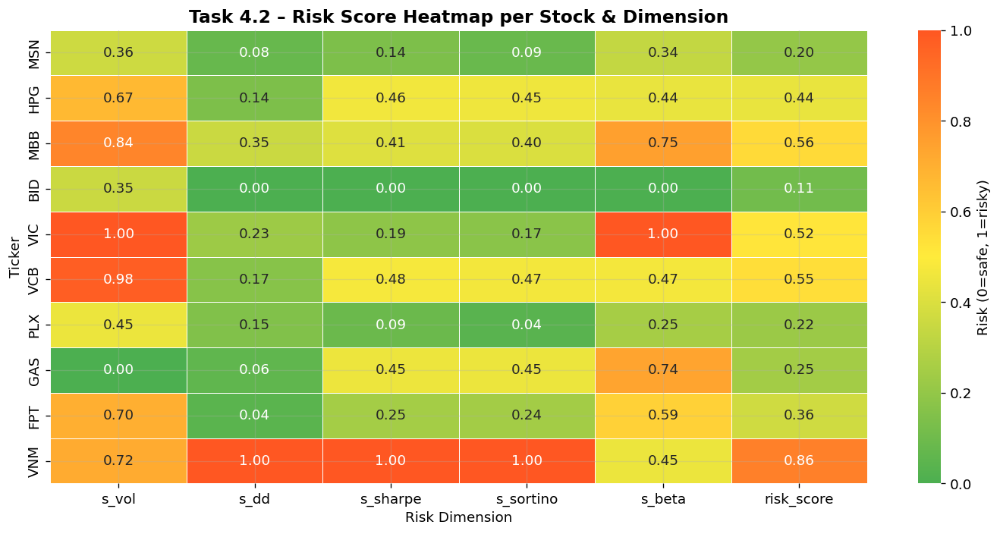

In [22]:
# Risk Score Heatmap
score_cols = ['s_vol','s_dd','s_sharpe','s_sortino','s_beta','risk_score']
heat_data  = risk_full_df.set_index('ticker')[score_cols]

fig, ax = plt.subplots(figsize=(12, 6))
cmap = LinearSegmentedColormap.from_list('rg', ['#4CAF50','#FFEB3B','#FF5722'])
sns.heatmap(heat_data, annot=True, fmt='.2f', cmap=cmap,
            linewidths=0.5, linecolor='white',
            ax=ax, vmin=0, vmax=1,
            cbar_kws={'label': 'Risk (0=safe, 1=risky)'})
ax.set_title('Task 4.2 – Risk Score Heatmap per Stock & Dimension',
             fontsize=14, fontweight='bold')
ax.set_xlabel('Risk Dimension')
ax.set_ylabel('Ticker')
plt.tight_layout()
plt.show()


### Task 4.3 -  Portfolio Optimisation (Markowitz / Mean-Variance)

In [37]:
from scipy.optimize import minimize # Added import
TRADING_DAYS = 252
returns_dict = {}
for ticker in qualified: # Changed safe_tickers to qualified
    df = enriched[ticker]
    returns_dict[ticker] = df.set_index('date')['close'].pct_change().dropna()

returns_df = pd.DataFrame(returns_dict).dropna()
mu  = returns_df.mean().values * TRADING_DAYS          # annualised expected returns
cov = returns_df.cov().values   * TRADING_DAYS         # annualised covariance matrix

n = len(qualified) # Changed safe_tickers to qualified

def portfolio_perf(weights):
    ret = np.dot(weights, mu)
    vol = np.sqrt(weights @ cov @ weights)
    return ret, vol

def neg_sharpe(weights):
    r, v = portfolio_perf(weights)
    return -r / (v + 1e-8)

def min_vol(weights):
    _, v = portfolio_perf(weights)
    return v

constraints = {'type': 'eq', 'fun': lambda w: np.sum(w) - 1}
bounds = tuple((0, 1) for _ in range(n))
w0 = np.ones(n) / n

# Max Sharpe ratio portfolio
res_sharpe = minimize(neg_sharpe, w0, method='SLSQP',
                      bounds=bounds, constraints=constraints)
w_sharpe = res_sharpe.x

# Min volatility portfolio
res_minvol = minimize(min_vol, w0, method='SLSQP',
                      bounds=bounds, constraints=constraints)
w_minvol = res_minvol.x

# Equal weight baseline
w_equal = np.ones(n) / n

print("\n Portfolio Summary ")
for label, w in [('Equal Weight', w_equal), ('Max Sharpe', w_sharpe), ('Min Volatility', w_minvol)]:
    r, v = portfolio_perf(w)
    s = r / v
    print(f"  {label:18s}  Return={r:.2%}  Vol={v:.2%}  Sharpe={s:.3f}")

print("\nMax Sharpe weights:")
for t, w in zip(qualified, w_sharpe): # Changed safe_tickers to qualified
    print(f"  {t}: {w:.2%}")


 Portfolio Summary 
  Equal Weight        Return=16.26%  Vol=11.17%  Sharpe=1.456
  Max Sharpe          Return=21.66%  Vol=12.87%  Sharpe=1.684
  Min Volatility      Return=16.16%  Vol=11.16%  Sharpe=1.448

Max Sharpe weights:
  BID: 14.45%
  FPT: 20.09%
  GAS: 0.00%
  HPG: 17.45%
  MSN: 23.77%
  PLX: 8.49%
  VCB: 7.46%
  VIC: 8.29%


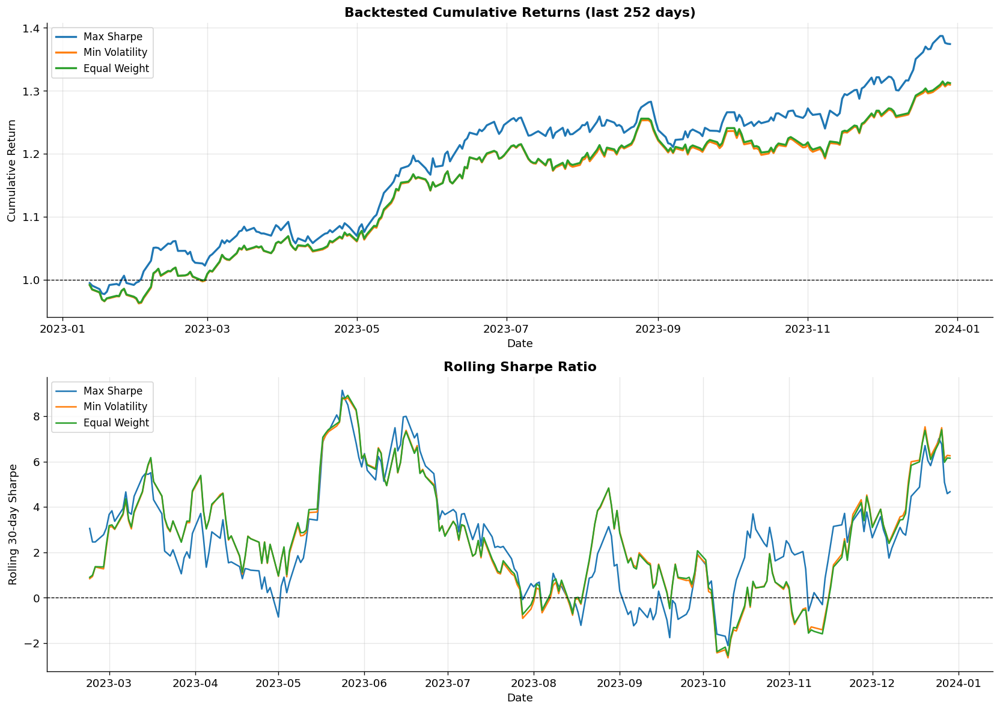

In [39]:
# Backtested Portfolio Returns
# Simulate how each strategy would have performed on the LAST 252 trading days

# Ensure portfolio optimization weights are available from Task 4.3 (cell SgbddHUvATkL)
if 'w_sharpe' not in globals() or 'w_minvol' not in globals() or 'w_equal' not in globals():
    print("WARNING: Portfolio optimization weights (w_sharpe, w_minvol, w_equal) are not defined.")
    print("Please ensure the preceding cell 'SgbddHUvATkL' (Task 4.3 Portfolio Optimisation) has been executed.")
    raise NameError("Required portfolio weights not found. Please run the portfolio optimization cell (SgbddHUvATkL).")


fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))

# Define the strategies dictionary
strategies = {
    'Max Sharpe': w_sharpe,
    'Min Volatility': w_minvol,
    'Equal Weight': w_equal
}

ret_hist = pd.DataFrame({
    t: enriched[t].set_index('date')['close'].pct_change()
    for t in qualified if t in enriched
}).dropna().tail(252)

for name, w in strategies.items():
    port_ret  = ret_hist @ w
    cum_ret   = (1 + port_ret).cumprod()
    ax1.plot(ret_hist.index, cum_ret.values, lw=2, label=name)

ax1.axhline(1, color='black', ls='--', lw=0.8)
ax1.set_ylabel('Cumulative Return'); ax1.set_xlabel('Date')
ax1.set_title('Backtested Cumulative Returns (last 252 days)', fontweight='bold')
ax1.legend(fontsize=10)

# Rolling 30-day Sharpe
for name, w in strategies.items():
    port_ret  = ret_hist @ w
    roll_sh   = (port_ret.rolling(30).mean() / (port_ret.rolling(30).std() + 1e-9)) * np.sqrt(252)
    ax2.plot(ret_hist.index, roll_sh.values, lw=1.5, label=name)

ax2.axhline(0, color='black', ls='--', lw=0.8)
ax2.set_ylabel('Rolling 30-day Sharpe'); ax2.set_xlabel('Date')
ax2.set_title('Rolling Sharpe Ratio', fontweight='bold')
ax2.legend(fontsize=10)
plt.tight_layout()
plt.show()

In [24]:
# BALANCED PORTFOLIO BUILDER

def build_balanced_portfolio(dataframes_list, mse_list, model_dicts,
                              industry_labels, min_stocks_per_industry=1):
    """
    Direct extension of sample code's build_balanced_portfolio.
    Ensures each sector gets at least one representative.
    """
    raw = build_portfolio(dataframes_list, mse_list, model_dicts, industry_labels)

    balanced_df = pd.DataFrame()
    for industry in raw['sector'].unique():
        ind_stocks = raw[raw['sector'] == industry]
        # Changed 'predicted_profit' to 'expected_return_%'
        top        = ind_stocks.nlargest(min_stocks_per_industry, 'expected_return_%')
        balanced_df= pd.concat([balanced_df, top], ignore_index=True)

    balanced_df.sort_values('expected_return_%', ascending=False, inplace=True)
    balanced_df.reset_index(drop=True, inplace=True)
    return balanced_df

# Qualified universe: profitable + safe
profitable_tickers = portfolio_df[portfolio_df['expected_return_%'] > 0]['ticker'].tolist()
safe_tickers       = safe_df['ticker'].tolist()
qualified          = sorted(set(profitable_tickers) & set(safe_tickers))

# Fallback: relax to top 5 safe stocks if intersection too small
if len(qualified) < 3:
    qualified = safe_df.nsmallest(5, 'risk_score')['ticker'].tolist()
    print(f"  Fallback: using top-5 safe stocks: {qualified}")

print(f"Qualified for portfolio: {qualified}")

# Balanced portfolio (sector-representative)
q_dfs  = [enriched[t].copy() for t in qualified if t in enriched]
q_mse  = [results_22.get(t,{}).get('metrics',{}).get('MAPE%',5)/100 for t in qualified if t in enriched]
q_mods = [results_22.get(t) for t in qualified if t in enriched]
q_sec  = [SECTOR_MAP.get(t,'?') for t in qualified if t in enriched]
for df in q_dfs:
    df['ticker'] = df['ticker'].iloc[0]

balanced_portfolio_df = build_balanced_portfolio(q_dfs, q_mse, q_mods, q_sec)
print("\nBalanced portfolio:")
display(balanced_portfolio_df[['ticker','sector','expected_return_%',
                                'expected_return_%','stability']].round(3))

Qualified for portfolio: ['BID', 'FPT', 'GAS', 'HPG', 'MSN', 'PLX', 'VCB', 'VIC']

Balanced portfolio:


,ticker,sector,expected_return_%,expected_return_%,stability
0,PLX,Energy,3.915,3.915,0.955
1,FPT,Technology,2.815,2.815,0.945
2,VIC,Real Estate,2.476,2.476,0.976
3,BID,Banking,2.164,2.164,0.964
4,MSN,Consumer,-1.997,-1.997,0.940
5,HPG,Materials,-2.921,-2.921,0.982


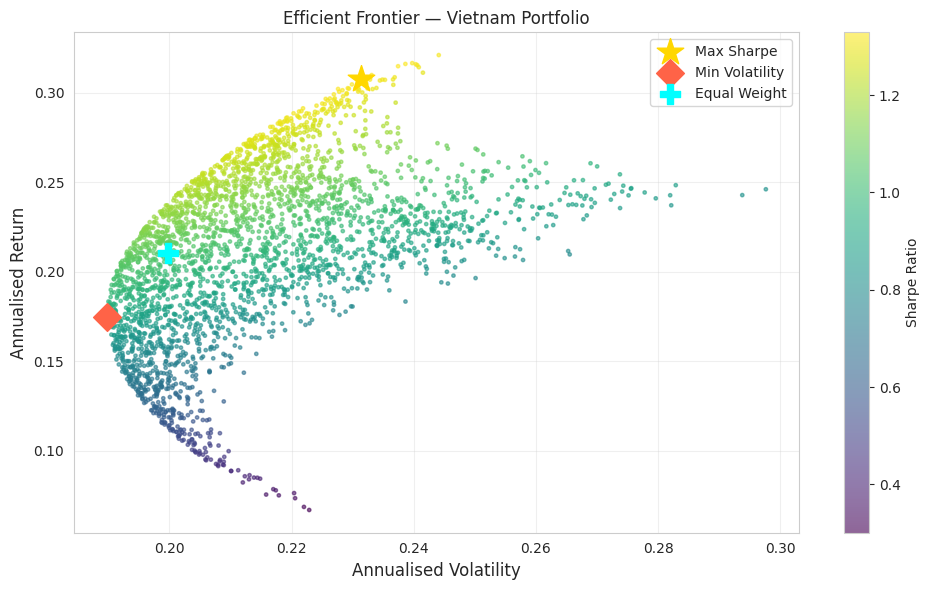

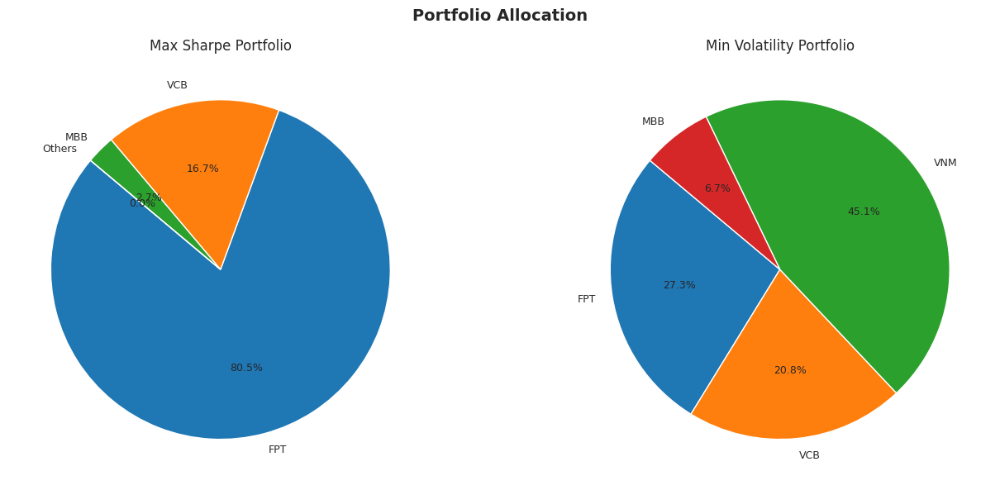

In [ ]:
#  Efficient Frontier simulation
NUM_SIM = 3000
sim_returns, sim_vols, sim_sharpes, sim_weights = [], [], [], []

for _ in range(NUM_SIM):
    w = np.random.dirichlet(np.ones(n))
    r, v = portfolio_perf(w)
    sim_returns.append(r)
    sim_vols.append(v)
    sim_sharpes.append(r / (v + 1e-8))
    sim_weights.append(w)

fig, ax = plt.subplots(figsize=(10, 6))
sc = ax.scatter(sim_vols, sim_returns, c=sim_sharpes, cmap='viridis', s=6, alpha=0.6)
plt.colorbar(sc, label='Sharpe Ratio')

# Mark special portfolios
r_s, v_s = portfolio_perf(w_sharpe)
r_m, v_m = portfolio_perf(w_minvol)
r_e, v_e = portfolio_perf(w_equal)
ax.scatter(v_s, r_s, marker='*', s=400, color='gold',   zorder=10, label='Max Sharpe')
ax.scatter(v_m, r_m, marker='D', s=200, color='tomato', zorder=10, label='Min Volatility')
ax.scatter(v_e, r_e, marker='P', s=200, color='cyan',   zorder=10, label='Equal Weight')
ax.set_xlabel('Annualised Volatility', fontsize=12)
ax.set_ylabel('Annualised Return', fontsize=12)
ax.set_title('Efficient Frontier — Vietnam Portfolio')
ax.legend(); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

#  Allocation pie chart
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
for ax, (label, w) in zip(axes, [('Max Sharpe', w_sharpe), ('Min Volatility', w_minvol)]):
    thresh = 0.02
    others = w[w < thresh].sum()
    tickers_pie = [t for t, wi in zip(safe_tickers, w) if wi >= thresh]
    weights_pie = [wi for wi in w if wi >= thresh]
    if others > 0:
        tickers_pie.append('Others')
        weights_pie.append(others)
    ax.pie(weights_pie, labels=tickers_pie, autopct='%1.1f%%',
           startangle=140, textprops={'fontsize': 9})
    ax.set_title(f'{label} Portfolio', fontsize=12)
plt.suptitle('Portfolio Allocation', fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

---
## Task 5 — Deployment & SaaS Guidelines

> **Note:** Full deployment goes beyond a notebook. This section provides:
> 1. A FastAPI REST wrapper you can deploy to any cloud
> 2. A guide for the web designer

### Task 5.1 — Model Deployment (FastAPI REST API)

In [23]:
# Save trained models
import os

os.makedirs('saved_models', exist_ok=True)

# Save price prediction models (Task 2.1)
# task21_results is populated by cell JD5COEajezyx
for ticker, res in task21_results.items():
    res['model'].save(f'saved_models/{ticker}_price_model.h5')
    print(f"Saved: saved_models/{ticker}_price_model.h5")

# Save signal classification models (Task 3)
# model_buy and model_sell are global variables created by cell 9cxnC5r9-aiL
# There is no 'task3_results' dictionary that stores models per ticker in this notebook.
if 'model_buy' in globals() and 'model_sell' in globals():
    model_buy.save('saved_models/buy_signal_lstm.h5')
    model_sell.save('saved_models/sell_signal_lstm.h5')
    print("Saved: saved_models/buy_signal_lstm.h5")
    print("Saved: saved_models/sell_signal_lstm.h5")
else:
    print("Warning: Buy/Sell signal models (model_buy, model_sell) were not found. Please ensure Task 3 training cell has run.")


Saved: saved_models/MSN_price_model.h5
Saved: saved_models/HPG_price_model.h5
Saved: saved_models/MBB_price_model.h5
Saved: saved_models/BID_price_model.h5
Saved: saved_models/VIC_price_model.h5
Saved: saved_models/VCB_price_model.h5
Saved: saved_models/PLX_price_model.h5
Saved: saved_models/GAS_price_model.h5
Saved: saved_models/FPT_price_model.h5
Saved: saved_models/VNM_price_model.h5


In [22]:
#  Save trained models
import os
os.makedirs('saved_models', exist_ok=True)

for ticker, res in task21_results.items():
    res['model'].save(f'saved_models/{ticker}_price_model.h5')
    print(f"Saved: saved_models/{ticker}_price_model.h5")

Saved: saved_models/MSN_price_model.h5
Saved: saved_models/HPG_price_model.h5
Saved: saved_models/MBB_price_model.h5
Saved: saved_models/BID_price_model.h5
Saved: saved_models/VIC_price_model.h5
Saved: saved_models/VCB_price_model.h5


Saved: saved_models/PLX_price_model.h5
Saved: saved_models/GAS_price_model.h5


Saved: saved_models/FPT_price_model.h5
Saved: saved_models/VNM_price_model.h5


In [24]:
import shutil
from google.colab import files

# Compress the folder
shutil.make_archive('saved_models', 'zip', 'saved_models')

# Download the zip file
files.download('saved_models.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>